### <font color='darkcyan'>Dervla Scully 18329511</font>

In [1]:
import json
import pandas as pd
import networkx as nx
import itertools
from collections import Counter
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
import scipy
import matplotlib.colors as mcolors
import operator

pd.options.display.max_rows = 6
pd.options.display.max_columns = None

# <font color='teal'>COMP30850 Assignment 1 - Analysis of Co-Starring Networks</font>

In this assignment I will construct and characterise network representations of two movie-related datasets. My networks will model the co-starring relations between the actors within these two datasets. 

I will construct each of my networks and compare the structure, connectivity and centrality of the networks. I will then identify one important node in each dataset and construct an ego network for each, before exploring the structure, connectivity and centrality of the ego networks.

## <font color='darkcyan'>Task 1: Network Construction</font>

Each dataset is represented as a JSON file, containing information about the actors and the movies in which they starred. In this section, for each dataset I will:


a) Parse the JSON data and create an appropriate co-starring network using NetworkX, where nodes represent individual actors.


b) Identify and remove any isolated nodes from the network.

## <font color='cadetblue'>Task 1 Network 1</font>

For task 1 I will begin with my first dataset, 18329511-dataset1.json, and collect, prepare and clean my data, construct my networkx graph and remove isolated nodes, before repeating for my second dataset.

### <font color='cadetblue'>Data Collection & Preperation</font>

I will start by reading the data from the JSON files into pandas dataframes. When read into a pandas DF, each row corresponds to an actor, and contains an id string, name, date of birth, and a list of dictionaries containing data about the movies they have acted in. These dictionaries contain movie id, title, year the movie was made, and the kind of movie.

Example:

    001715, George C. Scott, 1927-10-18,[{ "id": "0120683", "title": "Gloria", "year": 1999, "kind": 
    "movie" },{ "id": "0115392", "title": "Titanic", "year": 1996, "kind": "movie"} ]


For convenience when constructing my networks, I instead want to have each row in my actors dataframe to contain  id, name, DOB and a list of movie ids corresponding to the movies that actor acted in. I then want to have a seperate dataframe for movies, where each row corresponds to a movie, containing id, name, year, kind.

Example: 

    Actor DF: 

    001715, George C. Scott, 1927-10-18, [0120683, 0115392]
    ......

    Movie DF: 

    0120683, Gloria, 1999, movie
    0115392, Titanic, 1996, movie
    .....


Due to the fact that I will be doing the above for two seperate JSON files I will write functions so that the code can be reused for the second file.

I have written a set of functions below to read from the JSON files, construct the dataframes, and clean the data.

__Read Json Function__

Function that takes a json file (file path string) as argument, and reads the file into a pandas dataframe.
The function returns the pandas dataframe.

In [2]:
def readJson(file):
    
    print("\nStep 1. Read from JSON to pandas DF\n")
    
    ActorsDF = pd.read_json(file) # read from json into pandas df
    
    # convert id to string, add leading zeros so that strings are all length 7
    ActorsDF["id"] = ActorsDF["id"].apply(str).apply(lambda x: '{0:0>7}'.format(x))
    
    print("Actors Dataframe:")
    display(ActorsDF)
    
    return ActorsDF

__Extract Movies Function__

A function that takes in an actors dataframe as argument.

The function returns 2 lists: 
1. a list moviesList which contains lists of the form [id, title, year, kind] for each movie movie in the ActorsDF dataframe.
2. a list fullActorsMovieList of movie id lists corresponding to the actors in the actors DF. (first element in the list is a list of movie ids corresponding to the first actor in the actors dataframe, and so on)

In [3]:
def extractMovies(ActorsDF):
    
    
    print("\nStep 2.\n-Extract movie data\n-Extract movie ids for each actor\n")
    
        # list which will hold sublists of the form [id, title, year, kind] for each movie
    movieList = []

        # list which will hold lists of movie ids corresponding to each actor
        # index i will hold a list of movie ids which corresponds to the actor in the ith row of the ActorsDF
    fullActorsMovieList = []

    
        # iterate through each actor (each row)
    for i in range(0, len(ActorsDF.index)):
    
        actorsMovies = []     # list which will hold movie ids for the ith actor
    
            # iterate through each movie for the ith actor
        for j in range (0, len(ActorsDF.iloc[i]["movies"])):
        
                # ActorsDF.iloc[i]["movies"][j] is a dictionary
                # extract just the values
                # temp is a list of the form [id value, title value, year value, kind value] for the jth movie of the ith actor
            temp = (lambda x : [v for k,v in x.items()])(ActorsDF.iloc[i]["movies"][j])

            movieList.append(temp) # add the whole list to the list of movies
        
            actorsMovies.append(temp[0]) # add just the id to the list of movies for the given actor
        
        # actorsMovies is now a list of movie ids for the ith actor
        # add this list to the full list of actors movies list
        fullActorsMovieList.append(actorsMovies)
     
    # print first few movies in movie list
    print("Snippet of Movie List:\n")
    for i in range(0,5): print(movieList[i])

    # print first few lists of movie ids in full actor's movie list
    print("\n\nSnippet of Actor's Movie List:")
    print("Each element is a list of movie ids corresponding to an actor.\n\n")
    for i in range(0,3): print(fullActorsMovieList[i], "\n")
        
        
        
    return (movieList, fullActorsMovieList)

__Construct Movies Dataframe Function__

Function which takes in an actors dataframe and a movie list constructed in extractMovies function.
The function constructs a movies dataframe from the movie list.
The newly constructed movies dataframe is returned.

In [4]:
# The splitKeys function is a helper function to extract column names.
def splitKeys(x):
    return [k for k,v in x[0].items()]

def constructMoviesDF(ActorsDF, movieList):
    
    print("\nStep 3. Construct movies dataframe\n")
    
        # the movie column in actors DF is a list of dictionaries, each with the keys id, title, year, type
        # extract these keys to use as column names
    columns = ActorsDF.movies.apply(splitKeys)[0] 
    
    print("Columns: ", columns)

    print("\nMovies DF:\n")
    
        # construct dataframe from the list of movies
        # each list is of the form [id, title, year, type]
        # each list will be a row in the data from, and the columns are id, title, year, type
    MoviesDF = pd.DataFrame(movieList, columns=columns)

    display(MoviesDF)
    
    return MoviesDF

__Checker Function__

Checks that the number of rows in movies DF equals the number of movies. Checks that the length of fullActorsMovieList equals the number of actors.

In [5]:
def check(ActorsDF, MoviesDF, fullActorsMovieList):
    
    print("\nStep 4.\n-Check number of rows in movies dataframe equals the total number of movies")
    print("-Check length of actor's movies list equals number of rows in actors dataframe\n")
    
    
    # Check that the number of rows in moviesDF equals the number of movies
    totalNumberOfMovies = 0
    for i in range (0, len(ActorsDF.index)): 
        totalNumberOfMovies += len(ActorsDF.iloc[i]["movies"])
        
        
    print("Total Number of Movies: ", totalNumberOfMovies)
    print(MoviesDF.shape[0]==totalNumberOfMovies)

    # Check that the length of fullActorsMovieList equals the number of actors
    print("\nNumber of Actors: ", ActorsDF.shape[0])
    print(ActorsDF.shape[0]==len(fullActorsMovieList))

__Movies Column in Actors Dataframe Function__

Function which takes in an actors dataframe and the list of lists of movie ids corresponding to each actor constructed in extractMovies function. Replaces the movies function in the actors dataframe, which contains a list of dictionaries in each row, with a list of movies ids in each row.

In [6]:
def moviesColumnActorsDF(ActorsDF, fullActorsMovieList):
    print("\nStep 5.\nReplace movie column in actors dataframe")
    print("\nActors DF:\n")
    display(ActorsDF)

    # replace the data in movies column with the list of movie ids
    ActorsDF["movies"]=fullActorsMovieList

    print("\nActors DF: replace movies column\n")
    display(ActorsDF)
    return ActorsDF

__Remove Duplicates from Movies Dataframe Function__

If any two actors in the actors dataframe acted together in a movie there will be duplicated in the movies dataframe. This function takes in the movie dataframe and removes the duplicates.

There were some instances, for example the movie Drunk History, where two actors in the dataset acted in the movie, the movie id was the same for both, but the year was different, so drop_duplicates function did not remove the duplicate. Therefore, I am giving subset="id" as argument to drop_duplicates so that only id will be considered when dropping duplicates. 

In [7]:
def removeDuplicates(MoviesDF):
    
    print("\nStep 6.\nRemove duplicates from movies dataframe")
    display(MoviesDF)
    
    # remove duplicate rows
    MoviesDF = MoviesDF.drop_duplicates(subset="id",keep='first') # subset='id', keep only the first occurrence
    
    print("Movies DF remove duplicates:\n")
    display(MoviesDF)
    
    return MoviesDF

__Set Index Function__

Set the index in movies and actors dataframes to movie and actor ids.

In [8]:
def setIndex(ActorsDF, MoviesDF):
    print("\nStep 7. Set index to id in actors and movies dataframes")
    ActorsDF = ActorsDF.set_index("id")
    MoviesDF = MoviesDF.set_index("id")
    return (ActorsDF, MoviesDF)

__Collect and Clean Data Function__

Function which calls all of the above functions to collect the data and construct and clean the dataframes.

In [9]:
def collectAndCleanData(file):
    
    ActorsDF = readJson(file) # read json file into dataframe
    
    tup = extractMovies(ActorsDF) # extract the movies, returns the tuple (moviesList, fullActorsMoviesList)
    
    MoviesDF = constructMoviesDF(ActorsDF, tup[0]) # construct movies dataframe
    
    check(ActorsDF, MoviesDF, tup[1]) # checker
    
    ActorsDF = moviesColumnActorsDF(ActorsDF, tup[1]) # replace movies column in actors dataframe
    
    MoviesDF = removeDuplicates(MoviesDF) # remove duplicate movies from movies dataframe
    
    DFs = setIndex(ActorsDF, MoviesDF) # set indexes to actor and movie IDs 
    
    print("\n\nCleaned Actors Dataframe: ")
    display(DFs[0])
    print("\n\nCleaned Movies Dataframe: ")
    display(DFs[1])
    
    
    return DFs

__Construct Dataframes for Network 1__

In [10]:
tuples = collectAndCleanData("18329511/18329511-dataset1.json")
ActorsDF1 = tuples[0]
MoviesDF1 = tuples[1]


Step 1. Read from JSON to pandas DF

Actors Dataframe:


,id,name,born,movies
0,0001715,George C. Scott,1927-10-18,"[{'id': '0120683', 'title': 'Gloria', 'year': ..."
1,1589825,Kali Hawk,1986-10-04,"[{'id': '8829830', 'title': 'Fatale', 'year': ..."
2,0001631,Sarah Polley,1979-01-08,"[{'id': '1624408', 'title': 'Trigger', 'year':..."
...,...,...,...,...
147,0001768,Rod Steiger,1925-04-14,"[{'id': '0273982', 'title': 'Poolhall Junkies'..."
148,0001627,Sidney Poitier,1927-02-20,"[{'id': '0119395', 'title': 'The Jackal', 'yea..."
149,0000110,Kenneth Branagh,1960-12-10,"[{'id': '6723592', 'title': 'Tenet', 'year': 2..."



Step 2.
-Extract movie data
-Extract movie ids for each actor

Snippet of Movie List:

['0120683', 'Gloria', 1999, 'movie']
['0115392', 'Titanic', 1996, 'movie']
['0112368', 'Angus', 1995, 'movie']
['0107497', 'Malice', 1993, 'movie']
['0100477', 'The Rescuers Down Under', 1990, 'movie']


Snippet of Actor's Movie List:
Each element is a list of movie ids corresponding to an actor.


['0120683', '0115392', '0112368', '0107497', '0100477', '0099528', '0088579', '0087262', '0083169', '0080754', '0080516', '0079271', '0077952', '0077381', '0076211', '0073113'] 

['8829830', '10380084', '8461048', '3253232', '4871980', '4667094', '3262022', '4459162', '3273434', '3281608', '2854458', '1699755', '2265221', '1674776', '1523939', '1999105', '1488164', '1478338', '1226229', '1078940', '1405787', '1478412', '1185234', '1029333', '0372975', '6037102', '0881962', '0431155', '8646298', '0458376', '0437043', '0443587', '12306288', '12305892', '0120533'] 

['1624408', '1017460', '0485947', '0472027

,id,title,year,kind
0,0120683,Gloria,1999,movie
1,0115392,Titanic,1996,movie
2,0112368,Angus,1995,movie
...,...,...,...,...
7253,0093562,A Month in the Country,1987,movie
7254,0086676,Boy in the Bush,1984,movie
7255,0082158,Chariots of Fire,1981,movie



Step 4.
-Check number of rows in movies dataframe equals the total number of movies
-Check length of actor's movies list equals number of rows in actors dataframe

Total Number of Movies:  7256
True

Number of Actors:  150
True

Step 5.
Replace movie column in actors dataframe

Actors DF:



,id,name,born,movies
0,0001715,George C. Scott,1927-10-18,"[{'id': '0120683', 'title': 'Gloria', 'year': ..."
1,1589825,Kali Hawk,1986-10-04,"[{'id': '8829830', 'title': 'Fatale', 'year': ..."
2,0001631,Sarah Polley,1979-01-08,"[{'id': '1624408', 'title': 'Trigger', 'year':..."
...,...,...,...,...
147,0001768,Rod Steiger,1925-04-14,"[{'id': '0273982', 'title': 'Poolhall Junkies'..."
148,0001627,Sidney Poitier,1927-02-20,"[{'id': '0119395', 'title': 'The Jackal', 'yea..."
149,0000110,Kenneth Branagh,1960-12-10,"[{'id': '6723592', 'title': 'Tenet', 'year': 2..."



Actors DF: replace movies column



,id,name,born,movies
0,0001715,George C. Scott,1927-10-18,"[0120683, 0115392, 0112368, 0107497, 0100477, ..."
1,1589825,Kali Hawk,1986-10-04,"[8829830, 10380084, 8461048, 3253232, 4871980,..."
2,0001631,Sarah Polley,1979-01-08,"[1624408, 1017460, 0485947, 0472027, 0402057, ..."
...,...,...,...,...
147,0001768,Rod Steiger,1925-04-14,"[0273982, 0239467, 0275527, 0133063, 0201726, ..."
148,0001627,Sidney Poitier,1927-02-20,"[0119395, 0113195, 0105435, 0102879, 0095532, ..."
149,0000110,Kenneth Branagh,1960-12-10,"[6723592, 8354218, 11126248, 9206798, 4154756,..."



Step 6.
Remove duplicates from movies dataframe


,id,title,year,kind
0,0120683,Gloria,1999,movie
1,0115392,Titanic,1996,movie
2,0112368,Angus,1995,movie
...,...,...,...,...
7253,0093562,A Month in the Country,1987,movie
7254,0086676,Boy in the Bush,1984,movie
7255,0082158,Chariots of Fire,1981,movie


Movies DF remove duplicates:



,id,title,year,kind
0,0120683,Gloria,1999,movie
1,0115392,Titanic,1996,movie
2,0112368,Angus,1995,movie
...,...,...,...,...
7247,0108265,Swing Kids,1993,movie
7253,0093562,A Month in the Country,1987,movie
7254,0086676,Boy in the Bush,1984,movie



Step 7. Set index to id in actors and movies dataframes


Cleaned Actors Dataframe: 


,name,born,movies
id,,,
0001715,George C. Scott,1927-10-18,"[0120683, 0115392, 0112368, 0107497, 0100477, ..."
1589825,Kali Hawk,1986-10-04,"[8829830, 10380084, 8461048, 3253232, 4871980,..."
0001631,Sarah Polley,1979-01-08,"[1624408, 1017460, 0485947, 0472027, 0402057, ..."
...,...,...,...
0001768,Rod Steiger,1925-04-14,"[0273982, 0239467, 0275527, 0133063, 0201726, ..."
0001627,Sidney Poitier,1927-02-20,"[0119395, 0113195, 0105435, 0102879, 0095532, ..."
0000110,Kenneth Branagh,1960-12-10,"[6723592, 8354218, 11126248, 9206798, 4154756,..."




Cleaned Movies Dataframe: 


,title,year,kind
id,,,
0120683,Gloria,1999,movie
0115392,Titanic,1996,movie
0112368,Angus,1995,movie
...,...,...,...
0108265,Swing Kids,1993,movie
0093562,A Month in the Country,1987,movie
0086676,Boy in the Bush,1984,movie


__Calculating Weights__

In my network, nodes will represent actors, and an edge between two nodes indicates that the two actors acted in a movie together. The weight of the edge will be determined by the number of movies the two actors acted together in.

To calculate the weights I will start by adding a column in the movies dataframe which conatins a list of actor ids of all of the actors in the data set who acted in the movie.

I will then be able to easily calculate the number of movies each pair of actors acted together in.

In [11]:
def addActorsColumn(ActorsDF, MoviesDF):
    
    # add empty actors column
    MoviesDF["actors"] = ""
    MoviesDF["actors"] = MoviesDF["actors"].apply(list)

    # iterate through each row in actors dataframe, i.e. each actor
    for actor in ActorsDF.iterrows():
    
        actorID = actor[0] # ID of current actor
    
        # iterate through movies for current actor
        for movieID in actor[1]["movies"]:
            
            # for each movie, append the list in the "actors" column in the corresponding row of the movies DF
            # with the current actors ID
            MoviesDF.loc[movieID]["actors"].append(actorID)
        
    display(MoviesDF)
    return MoviesDF

In [12]:
MoviesDF1 = addActorsColumn(ActorsDF1, MoviesDF1)

,title,year,kind,actors
id,,,,
0120683,Gloria,1999,movie,[0001715]
0115392,Titanic,1996,movie,[0001715]
0112368,Angus,1995,movie,[0001715]
...,...,...,...,...
0108265,Swing Kids,1993,movie,[0000110]
0093562,A Month in the Country,1987,movie,[0000110]
0086676,Boy in the Bush,1984,movie,[0000110]


## <font color='cadetblue'>Construct Networkx Graph</font>

Next I will construct my network for the first dataset

To represent each of my networks I have chosen __undirected, weighted networks__. 

__Nodes represent actors__, and an __edge between two nodes__ indicates that the two actors have __acted in a movie together__.

I have chosen an undirected graph as for one actor to have acted with another, the reverse must also be true. The "co-star" or "acted with" relation is always reciprocated by nature. For example, if Alan Rickman acted with Michael Gambon in 'Harry Potter and the Order of Pheonix', then it is also true that Michael Gambon acted with Alan Rickman in 'Harry Potter and the Order of Pheonix'. This is essentially a __co-presence network__. Thus, I have chosen an undirected network.

I have chosen a weighted network where the __weight__ of an edge between two nodes is the __number of movies that the two actors have acted together in__.

__Construct Network Graph, Edges And Weights__

Function which takes in the movie dataframe and constructs a networkx undirected graph with actors as nodes and an edge between two nodes if the two actors are in a movie together. The edge weight is the number of movies the two actors both together in.

Note:
I have added in a step (see * below) that ensures that isolated nodes are included. Task 1 said to 'identify' and 'remove' any isolated nodes from the network, so to be sure I am answering this correctly I am adding this step, in which the isolated nodes are included, and I will then identify and remove them later. However, removing this step would mean that the isolated nodes are never added and thus don't need to be removed. This would be more efficient.

The method returns the networkx graph.

In [13]:
def constructGraphEdgesAndWeights(MoviesDF):
    
    g= nx.Graph() # undirected graph

    for movie in MoviesDF.iterrows():
        
            # * see note: 
            # if movie only has one actor and there is not already a node with this actor
            # (This ensures that actors which are not in any movies with any of the other actors will still have a node, i.e. isolated nodes)
            # skipping this step means that isolated nodes will not be included
        
        if len(movie[1]["actors"])==1 and not g.has_node(movie[1]["actors"][0]):
            g.add_node(movie[1]["actors"][0])
            
            
        # if the number of actors in the movie is greater than 1
        if len(movie[1]["actors"])>1:       
        
            # get all unique pairs of actors from this movie
            for pair in itertools.combinations(movie[1]["actors"], r=2):
            
                    # do we have the edge already? if so, increment the weight on the edge
                if g.has_edge(pair[0], pair[1]):
                        # add edge
                    g[pair[0]][pair[1]]["weight"] += 1
                    
                        # append the existing movieIds list edge attribute with the movie ID
                    g[pair[0]][pair[1]]["movieIDs"].append(movie[0])
                        # append the existing movieTitles list edge attribute with the movie title
                    g[pair[0]][pair[1]]["movieTitles"].append(movie[1]["title"])
                
                
                # otherwise create a new edge with a weight of 1
                else:
                        # add edge
                    g.add_edge(pair[0], pair[1], weight=1)
                        # add movie ID (as a list) as edge attribute movieTitles
                    g[pair[0]][pair[1]]["movieIDs"] = [movie[0]]
                         # add movie title (as a list) as edge attribute movieIDs
                    g[pair[0]][pair[1]]["movieTitles"] = [movie[1]["title"]]
                  
    print("Graph successfully constructed.\nEdges and edge weights added.")
    return g

To check that the weights are correct we can calculate the sum of all weights. We can then calculate the total number of co-star interactions by iterating through the movies and compare these values.

In [14]:
def checkWeights(g, moviesDF):
    
    # convert the edges in the network to a Pandas DataFrame
    df = nx.to_pandas_edgelist(g)
    
    # count values of each weight
    weightOccurrences = df['weight'].value_counts()
    
    # sum weights
    weightSum=0
    for element in weightOccurrences.iteritems(): 
        weightSum += (element[0]*element[1])
    
    # sum of pairs of actors who acted together
    coStarSum = 0
    
    # for each movie, if more than 1 actor acted in the movie
    for index, movie in moviesDF.iterrows():
        
        if len(movie["actors"]) > 1:
            
            # calculate the number of pairs of actors for each movie
            coStarSum += len(movie["actors"])*(len(movie["actors"])-1)/2
        
    return (weightSum == int(coStarSum))

__Add Node Attributes__

Function that takes in as argument a networkx graph and actors dataframe and adds the actors names and dates of birth as node attributes. Returns the networkx graph.

In [15]:
def addNodeAttributes(g, ActorsDF):
    for node in g.nodes(data=True):
        
        node[1]["name"]=ActorsDF.loc[node[0]]["name"]
        node[1]["born"]=ActorsDF.loc[node[0]]["born"]
        
    print("Node Attributes added.")
    return g

__Construct Graph, Add Edges, Weights and Node Attributes for Network 1__

Using the functions above, construct the networkx graph.

In [16]:
g1 = constructGraphEdgesAndWeights(MoviesDF1)
g1 = addNodeAttributes(g1, ActorsDF1)
print("\nCheck weights are correct: ", checkWeights(g1, MoviesDF1))

Graph successfully constructed.
Edges and edge weights added.
Node Attributes added.

Check weights are correct:  True


__Visualising the network - Network Graph/Sociogram__

We can plot a collaboration graph / sociogram of our network. 

This function takes in a networkx graph as argument and plots a network diagram.

The __red nodes__ indicate that the node has degree 0, i.e. the node does not have any edges to other nodes, an __isolated node__. All other nodes (with degree greater than 0) are coloured blue.

The __colour of the edge lines indicates edge weight__, with lighter lines for lower edge weights and darker lines for higher edge weights (recall weight of edge between two actor nodes is the number of movies that the two actors are both in)

In [17]:
def isolatedNodeDiagram(g, num):
    plt.figure(3, figsize=(15,8)) 

    # blue => isolated
    # all other nodes are coloured blue
    color_map = []
    for node in g.nodes():
        
        if g.degree(node)==0: # degree 0 => isolated, colour in red
            color_map.append('tomato')
        else: 
            color_map.append('deepskyblue') 
            
            # increase distance between nodes so graph is less cluttered and easier to read
    pos = nx.spring_layout(g, k=1)

    nx.draw_networkx(g, pos, node_size=200, node_color=color_map, font_size=7, width=0.5, with_labels=False,  edge_color="lightgray")
    

    label = "Red node indicates degree 0 - isolated node\n"
    plt.title(label = label, loc='center', fontsize = 10)
    label = "Graph of Co-Starring Network " + str(num)
    plt.suptitle(t = label,  fontsize = 20)
    
    plt.axis('off')

    
    plt.show()

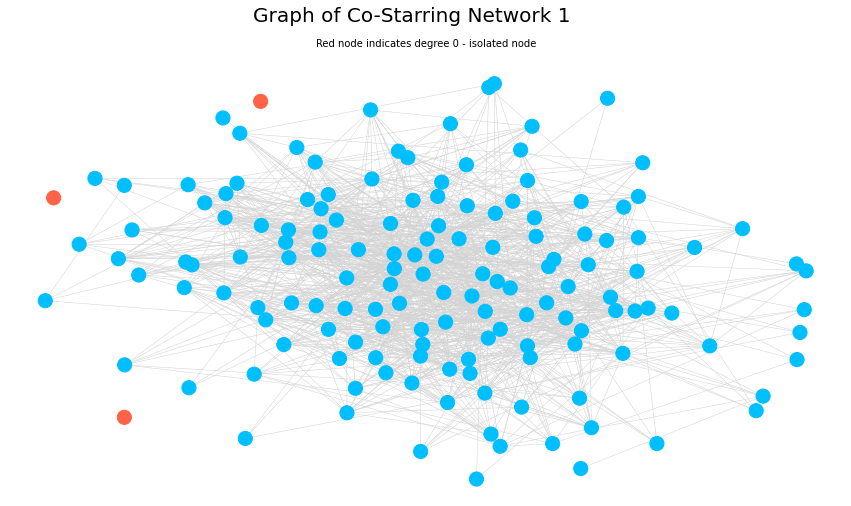

In [18]:
isolatedNodeDiagram(g1, 1)

__Remove Isolated Nodes__

We can see 3 isolated nodes (in red) in the graph plot above. We will now remove these nodes.

In [19]:
def removeIsolatedNodes(g):
    
    deg = pd.Series(dict(g.degree())) # degrees -> dictionary -> pandas series
    
    deg = deg.sort_values(ascending=True) # sort ascending

    for index, row in deg.iteritems(): # iterate through and remove node from graph if degree == 0
        if deg.loc[index] == 0:

            print("Isolated Node Removed: ", g.nodes[index], "\n")
            g.remove_node(index)

        if deg.loc[index] > 0: # sorted ascending so we know if degree > 0 then there are no more isolated nodes to remove
            break
    return g

Isolated Node Removed:  {'name': 'Ryôko Hirosue', 'born': '1980-07-18'} 

Isolated Node Removed:  {'name': 'David Niven', 'born': '1910-03-01'} 

Isolated Node Removed:  {'name': 'Kang Hye-jeong', 'born': '1982-01-04'} 



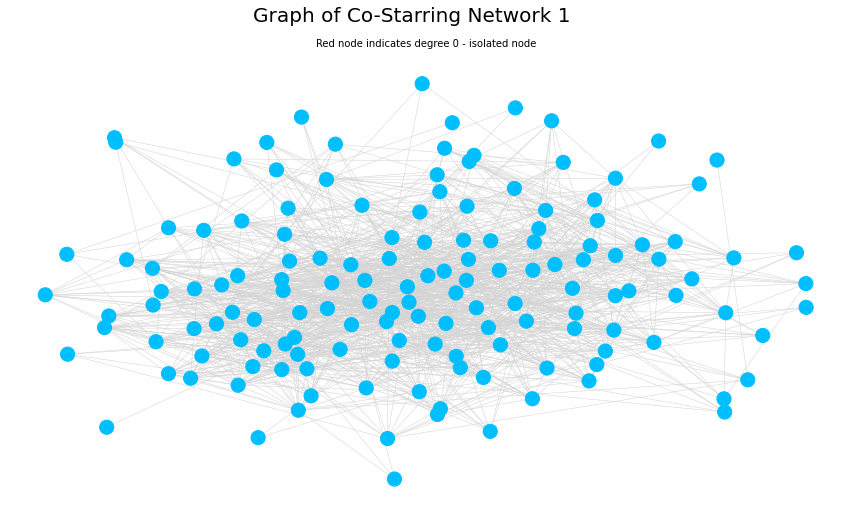

In [20]:
g1 = removeIsolatedNodes(g1)
isolatedNodeDiagram(g1, 1)

We can see from the diagram above that all isolated nodes were successfully removed.

## <font color='cadetblue'>Task 1 Network 2</font>

Next I will repeat all of the above for my second dataset, 18329511-dataset2.json. I will collect, prepare and clean my data, construct my networkx graph and remove isolated nodes using all of the functions defined and used for network 1.

__Collect data from JSON file to pandas dataframe and clean data__

In [21]:
tuples = collectAndCleanData("18329511/18329511-dataset2.json")
ActorsDF2 = tuples[0]
MoviesDF2 = tuples[1]


Step 1. Read from JSON to pandas DF

Actors Dataframe:


,id,name,born,movies
0,0731772,Cliff Robertson,1923-09-09,"[{'id': '0413300', 'title': 'Spider-Man 3', 'y..."
1,0000354,Matt Damon,1970-10-08,"[{'id': '6521876', 'title': 'Jay and Silent Bo..."
2,0000576,Sean Penn,1960-08-17,"[{'id': '5932728', 'title': 'The Professor and..."
...,...,...,...,...
160,4881749,Seána Kerslake,NaN,"[{'id': '2222052', 'title': 'My Salinger Year'..."
161,0000241,Jean-Claude Van Damme,1960-10-18,"[{'id': '13003820', 'title': 'AaRON: Ultrarêve..."
162,1325419,Kristen Wiig,1973-08-22,"[{'id': '7126948', 'title': 'Wonder Woman 1984..."



Step 2.
-Extract movie data
-Extract movie ids for each actor

Snippet of Movie List:

['0413300', 'Spider-Man 3', 2007, 'movie']
['0355954', 'Riding the Bullet', 2004, 'movie']
['0316654', 'Spider-Man 2', 2004, 'movie']
['0273041', '13th Child', 2002, 'movie']
['0145487', 'Spider-Man', 2002, 'movie']


Snippet of Actor's Movie List:
Each element is a list of movie ids corresponding to an actor.


['0413300', '0355954', '0316654', '0273041', '0145487', '0222020', '0171311', '0118646', '0127020', '0206501', '0116225', '0114075', '0092322', '0246421', '0110971', '0105824', '0103262', '0093483', '0090006', '0085271', '0085346', '0086355', '0079719', '0079476', '0077450', '0075597', '0076052', '0074991', '0074899', '0075212', '0073802', '0073501'] 

['6521876', '1950186', '5463162', '7153766', '3501632', '0491175', '1389072', '2034800', '4196776', '3659388', '5520670', '5520656', '0816692', '2177771', '8520958', '2333804', '1535108', '1291580', '2091473', '1389137', '1402488', '0466893', 

,id,title,year,kind
0,0413300,Spider-Man 3,2007,movie
1,0355954,Riding the Bullet,2004,movie
2,0316654,Spider-Man 2,2004,movie
...,...,...,...,...
7987,0349727,"Life, Death and Mini-Golf",2004,movie
7988,0323633,Melvin Goes to Dinner,2003,movie
7989,2005172,Carnata,2000,movie



Step 4.
-Check number of rows in movies dataframe equals the total number of movies
-Check length of actor's movies list equals number of rows in actors dataframe

Total Number of Movies:  7990
True

Number of Actors:  163
True

Step 5.
Replace movie column in actors dataframe

Actors DF:



,id,name,born,movies
0,0731772,Cliff Robertson,1923-09-09,"[{'id': '0413300', 'title': 'Spider-Man 3', 'y..."
1,0000354,Matt Damon,1970-10-08,"[{'id': '6521876', 'title': 'Jay and Silent Bo..."
2,0000576,Sean Penn,1960-08-17,"[{'id': '5932728', 'title': 'The Professor and..."
...,...,...,...,...
160,4881749,Seána Kerslake,NaN,"[{'id': '2222052', 'title': 'My Salinger Year'..."
161,0000241,Jean-Claude Van Damme,1960-10-18,"[{'id': '13003820', 'title': 'AaRON: Ultrarêve..."
162,1325419,Kristen Wiig,1973-08-22,"[{'id': '7126948', 'title': 'Wonder Woman 1984..."



Actors DF: replace movies column



,id,name,born,movies
0,0731772,Cliff Robertson,1923-09-09,"[0413300, 0355954, 0316654, 0273041, 0145487, ..."
1,0000354,Matt Damon,1970-10-08,"[6521876, 1950186, 5463162, 7153766, 3501632, ..."
2,0000576,Sean Penn,1960-08-17,"[5932728, 5770538, 1985949, 2515034, 6821164, ..."
...,...,...,...,...
160,4881749,Seána Kerslake,NaN,"[2222052, 6198946, 8649118, 6406848, 5831226, ..."
161,0000241,Jean-Claude Van Damme,1960-10-18,"[13003820, 7903530, 7816392, 5622412, 5208950,..."
162,1325419,Kristen Wiig,1973-08-22,"[7126948, 2365580, 2386490, 5109784, 1389072, ..."



Step 6.
Remove duplicates from movies dataframe


,id,title,year,kind
0,0413300,Spider-Man 3,2007,movie
1,0355954,Riding the Bullet,2004,movie
2,0316654,Spider-Man 2,2004,movie
...,...,...,...,...
7987,0349727,"Life, Death and Mini-Golf",2004,movie
7988,0323633,Melvin Goes to Dinner,2003,movie
7989,2005172,Carnata,2000,movie


Movies DF remove duplicates:



,id,title,year,kind
0,0413300,Spider-Man 3,2007,movie
1,0355954,Riding the Bullet,2004,movie
2,0316654,Spider-Man 2,2004,movie
...,...,...,...,...
7986,3175028,Confessions of a Tooth Fairy,2006,movie
7987,0349727,"Life, Death and Mini-Golf",2004,movie
7989,2005172,Carnata,2000,movie



Step 7. Set index to id in actors and movies dataframes


Cleaned Actors Dataframe: 


,name,born,movies
id,,,
0731772,Cliff Robertson,1923-09-09,"[0413300, 0355954, 0316654, 0273041, 0145487, ..."
0000354,Matt Damon,1970-10-08,"[6521876, 1950186, 5463162, 7153766, 3501632, ..."
0000576,Sean Penn,1960-08-17,"[5932728, 5770538, 1985949, 2515034, 6821164, ..."
...,...,...,...
4881749,Seána Kerslake,NaN,"[2222052, 6198946, 8649118, 6406848, 5831226, ..."
0000241,Jean-Claude Van Damme,1960-10-18,"[13003820, 7903530, 7816392, 5622412, 5208950,..."
1325419,Kristen Wiig,1973-08-22,"[7126948, 2365580, 2386490, 5109784, 1389072, ..."




Cleaned Movies Dataframe: 


,title,year,kind
id,,,
0413300,Spider-Man 3,2007,movie
0355954,Riding the Bullet,2004,movie
0316654,Spider-Man 2,2004,movie
...,...,...,...
3175028,Confessions of a Tooth Fairy,2006,movie
0349727,"Life, Death and Mini-Golf",2004,movie
2005172,Carnata,2000,movie


__Add actors column to movies dataframe for weight calculation__

In [22]:
MoviesDF2 = addActorsColumn(ActorsDF2, MoviesDF2)

,title,year,kind,actors
id,,,,
0413300,Spider-Man 3,2007,movie,"[0731772, 0000379]"
0355954,Riding the Bullet,2004,movie,[0731772]
0316654,Spider-Man 2,2004,movie,"[0731772, 0000379]"
...,...,...,...,...
3175028,Confessions of a Tooth Fairy,2006,movie,[1325419]
0349727,"Life, Death and Mini-Golf",2004,movie,[1325419]
2005172,Carnata,2000,movie,[1325419]


__Construct networkx graph for network 2__

Construct the graph using the functions defined in task 1 network 1.

In [23]:
g2 = constructGraphEdgesAndWeights(MoviesDF2)
g2 = addNodeAttributes(g2, ActorsDF2)
print("\nCheck weights are correct: ", checkWeights(g2, MoviesDF2))

Graph successfully constructed.
Edges and edge weights added.
Node Attributes added.

Check weights are correct:  True


__Plot network diagram to visualise and identify any isolated nodes__

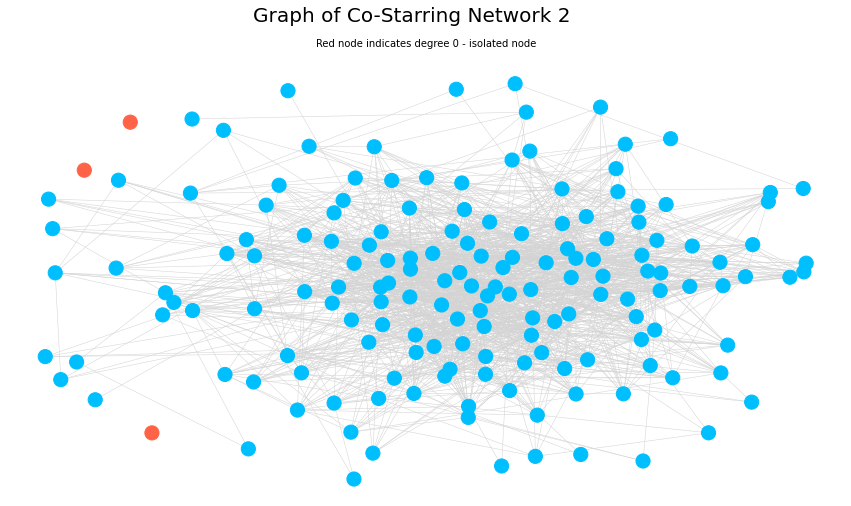

In [24]:
isolatedNodeDiagram(g2, 2)

3 isolated nodes are visible (in red). Next we can remove these nodes.

__Remove Isolated Nodes__

Isolated Node Removed:  {'name': 'Son Ye-Jin', 'born': '1982-01-11'} 

Isolated Node Removed:  {'name': 'Gracy Singh', 'born': '1980-07-20'} 

Isolated Node Removed:  {'name': 'Soha Ali Khan', 'born': '1978-10-04'} 



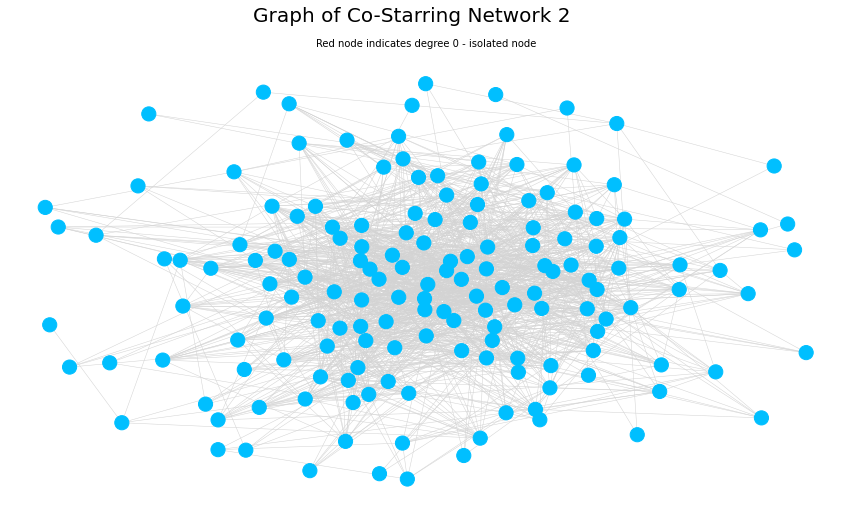

In [25]:
g2 = removeIsolatedNodes(g2)
isolatedNodeDiagram(g2, 2)

Now we can see that there are no isolated nodes (all nodes are blue).


For each of my datasets I have constructed my networks and removed isolated nodes. Task 1 is now complete.

# <font color='darkcyan'>Task 2: Network Characterisation</font>

For each of the networks created in Task 1:

    (i). Apply a range of different methods to characterise the structure and connectivity of the network

    (ii). Apply different centrality measures to identify important nodes in the network. Clearly explain and 
        interpret the results which are produced.



Based on the results from the above, discuss how the two networks are different (or similar) to one another.

I will begin Task 2 by characterising the structure and connectivity and identifying important nodes for each of my graphs seperately. I will then compare my results and findings for each network.

# <font color='cadetblue'>Task 2: Network 1</font>
### <font color='cadetblue'>(i) Characterise the structure and connectivity of the network</font>

I will start by looking at the number of nodes and edges in the network.

__Number of nodes and edges__

In [26]:
def numberEdgesAndWeights(g):
    print("Number of nodes: ", g.number_of_nodes())
    print("Number of edges: ", g.number_of_edges())

In [27]:
numberEdgesAndWeights(g1)

Number of nodes:  147
Number of edges:  1357


__Weight Distribution__

Next I will look at the disribution of the weights. Recall that the weight between two nodes in the network is the number of movies that the two actors acted together in.

__Weight Distribution Histogram__

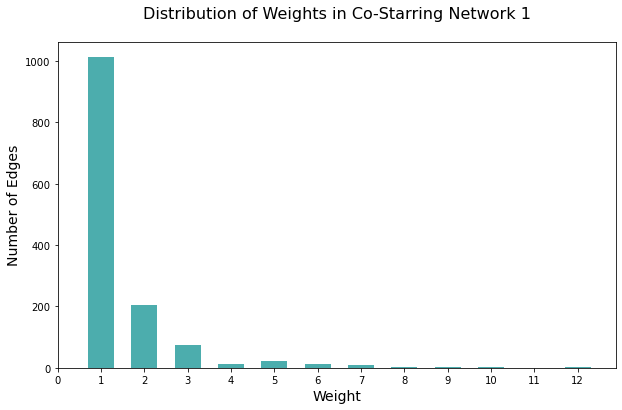

In [28]:
def weightDistribution(g, num):
    
    df = nx.to_pandas_edgelist(g)
    
    # caculate bins
    # because the values for weight are discrete I want the bins exactly between each whole number
    data = np.array(df["weight"])
    d = np.diff(np.unique(data)).min()
    left_of_first_bin = data.min() - float(d)/2
    right_of_last_bin = data.max() + float(d)/2
    
    plt.figure(figsize=(10, 6))
    
    plt.hist(data, np.arange(left_of_first_bin, right_of_last_bin + d, d),color="darkcyan", rwidth=0.6, alpha=0.7)
    
    # labels
    label = "Distribution of Weights in Co-Starring Network " + str(num) + "\n"
    plt.title(label, fontsize=16)
    plt.ylabel("Number of Edges", fontsize=14)
    plt.xlabel("Weight", fontsize=14)
    
    # ticks
    plt.xticks(np.arange(0, 13, step=1))
    
    mpl.rcParams['axes.spines.right'] = False
    mpl.rcParams['axes.spines.top'] = False
    

    plt.show()
    
weightDistribution(g1, 1)

As expected, we can see from the above histogram that the majority of edges have a weight of 1, about 75%. This means that for 75% of pairs of actors who acted together (i.e. acted in at least 1 movie together), they acted in exactly 1 movie together. We can see that 15% of edges had a weight of 2, and 5% had a weight of 3. Less than 5% of edges had a weight of 4 or greater. Only 0.1% had a weight of 12, which was the maximum weight.

To further visualise this we can look at our diagram of the network, and let the edge colour and width indicate the edge weight. 

In [29]:
# num refers to which network we are graphing (g1 or g2) (for printing purposes)

def weightDiagram(g, num):
    plt.figure(3, figsize=(20,10)) 
            
            # increase distance between nodes so graph is less cluttered and easier to read
            # k controls the distance between the nodes and varies between 0 and 1
    pos = nx.spring_layout(g, k=1.7)
    
    
            # get weights so that colour of edge can indicate weight
            # see 'edge_color=weights' in nx.draw_networkx
    edges,weights = zip(*nx.get_edge_attributes(g,'weight').items())
    
    
            # darken Reds colormap so lines are more visible for edges with lower weighting
    cmap = mpl.cm.Blues(np.linspace(0,1,20))
    cmap = mpl.colors.ListedColormap(cmap[2:,:-1])
    
    nx.draw_networkx(g, 
                     pos, 
                     node_size=150, 
                     node_color="silver", 
                     font_size=7, 
                     edgelist=edges, 
                     edge_color=weights, 
                     width=weights, 
                     with_labels=False, 
                     edge_cmap=cmap)

    label = "Colour of edge lines indicates weight, darker colour => higher weighting\n"
    plt.title(label = label, loc='center', fontsize = 10)
    
    label = "    Graph of Co-Starring Network " + str(num)
    
    plt.suptitle(t = label,  fontsize = 20)
    
    plt.axis('off')
    plt.show()

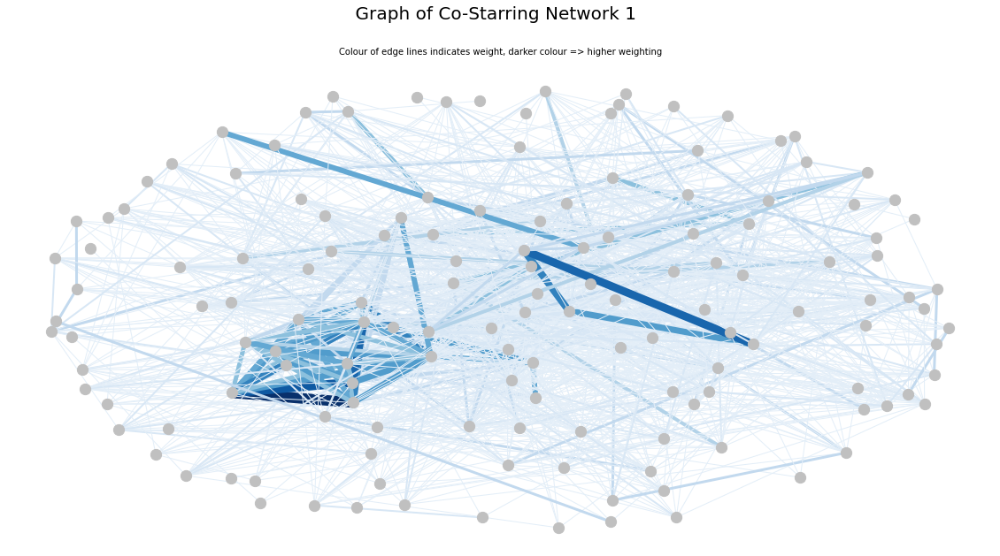

In [30]:
weightDiagram(g1, 1)

Due to the large number of nodes and edges it is slightly difficult to to make out a lot of the overlapping edges, but we can very clearly see that there is a very small number of the very dark and wide edge lines, and a much larger number of the thin, light coloured edge lines. 

Thus, the majority of edges have a very low weight, and very few have a high weight.

__Network Density__

To characterise the network structure further we can look at the network density. Network density refers to the portion of potential edges between nodes in a network that exist as actual edges. A network with high density is said to be dense, while a network with low density is said to be sparse.

Density is calculated numerically as the ratio of existing edges over the total number of potential edges between all pairs of nodes.

In [31]:
def networkDensity(g):

    # (could alternatively use the built in networkx function for density)
    numNodes = g.number_of_nodes()
    numEdges = g.number_of_edges()
    potentialEdges = numNodes*(numNodes - 1)/2
    density = numEdges / potentialEdges
    
    print("Number of potential edges: ", int(potentialEdges))
    print("Number of actual edges: ", numEdges)
    print("Network Density: ", round(density*100, 2), "%\n")
    
    # one could equally use the networkx function nx.density(g)

In [32]:
networkDensity(g1)

Number of potential edges:  10731
Number of actual edges:  1357
Network Density:  12.65 %



We can see that network 1 is quite sparse with a network density of only 12%. 12% of potential edges in the network are actual edges.

__Connected Components__

Next we can check if our network is connected. An undirected network is connected if there is a path between every pair of nodes in the network. 

In [33]:
print("Network 1 is connected: ", nx.is_connected(g1))

Network 1 is connected:  True


Our network is fully connected, and so there is only one connected component.

In [34]:
print("Number of connected components: ", nx.number_connected_components(g1))

Number of connected components:  1


Thus, there is a path between all nodes in the network.

__Network Diameter__

A network’s diameter is the maximum distance between all pairs of its nodes - i.e. the longest shortest path in the entire network. The diameter tells us how quickly information can be transmitted across the entire network. The higher the diameter, the less linked a network tends to be.

The diameter of the network will be infinite if the network is not fully connected. We know from above that our network is connected.

We can calculate the diameter using the networkx function nx.diameter().

In [35]:
print("Network 1 Diameter: ", nx.diameter(g1))

Network 1 Diameter:  5


We can see that network 1 has a diameter of 5. This means that the longest distance between any two nodes in the network, taking the shortest path possible, is 5, i.e. max of 5 edges must be crossed to get from one node to any other in the network.

We can visualise this by plotting our network graph and marking the longest shortest-path (there may be more than one path of this distance, we will mark one such path)

In [36]:
def longestShortestPath(g):

    pathLengths = {}
    
    # get the shortest path between all pairs of nodes
    # this is a dictionary where the keys are nodes (call these sources) and the value are dictionaries with key 
        # nodes (targets) and values distances from the source node to each of the target nodes.
    shortestPaths = dict(nx.all_pairs_shortest_path_length(g))
    
    # for each source node (keys of the dictionary)
    for node in shortestPaths:

        # for each of their target nodes
        # (keys of the dictionary which is the value in the outter dictionary for the current source node)
        for path in shortestPaths[node]:

            # source and target id as a string is key
            key = "%s, %s" % (node, path)
            
            # set value in pathLengths dictionary at this key to the shortest path between them
            pathLengths[key] = shortestPaths[node][path]

    # get the longest path in the pathLengths dictionary
    # this is the longest shortest path in the network
    # we now have a distance and source, target node for the longest shortest path
        # (one such pair of source,target nodes with longest shortest path as distance if there are multiple)
        
    # get key (source, target) of longest path
    longest = max(pathLengths.keys(), key=(lambda key: pathLengths[key]))
    
    # get the shortest path between these two nodes 
    # (all nodes that you must go through in order to get from one of these nodes to the other)
    
    path = nx.shortest_path(g, longest.split(", ")[0], longest.split(", ")[1])
    
    print("Longest Shortest Path = ", path)
    print("\nPath Length == Diameter:",nx.diameter(g) == len(path)-1)
    
    return path

In [37]:
path=longestShortestPath(g1)

Longest Shortest Path =  ['0000020', '0000032', '0000701', '0165101', '0000044', '0001627']

Path Length == Diameter: True


As expected, we can see that the longest shortes-path is of length 5. We can now plot our graph and mark each edge and node along the shortest path, as well as labelling the nodes with the actors names.

There may be more than 1 shortest path of this length, but we will show just 1 such path.

In [38]:
# node_list is a list of ids of nodes along the shortest path, these will be labelled
# source and target are the nodes with the longest shortest path between them

def drawDiameter(G, pos, num, node_list, source, target):
    
    plt.figure(3, figsize=(18,8)) 
    
    # get the shortest path between the two nodes
    path = nx.shortest_path(G,source,target)
    path_edges = zip(path,path[1:])
    path_edges = set(path_edges)
    
    # draw the simple graph
    nx.draw(G,pos,node_color='dodgerblue', edge_color="lightgray")
    
    # add the nodes along the longest shortest path on top of this in red
    nodes = nx.draw_networkx_nodes(G,pos,nodelist=path,node_color='r')

    # add the edges along the longest shortest path on top of this in red
    nx.draw_networkx_edges(G,pos,edgelist=path_edges,edge_color='r',width=2)

    # label the nodes along the longest shortest path
    if not node_list==[]:
        labels = {}    
        for node in G.nodes():
            if node in node_list:
                labels[node] = G.nodes[node]["name"]
                
        labelNodes = nx.draw_networkx_labels(G,pos,labels,font_size=9,font_color='black', font_weight="bold")

    label = "\n\nGraph of Co-Starring Network "  + str(num) +" Showing Longest Shortest-Path\n"
    plt.title(label = label, fontsize = 20)

    
    plt.show()

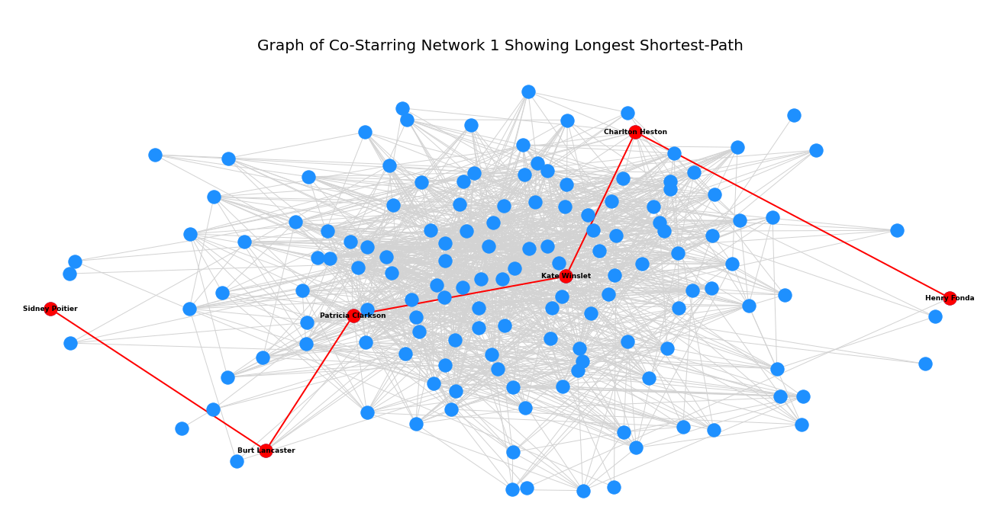

In [39]:
pos = nx.spring_layout(g1, seed=675, k=1)
drawDiameter(g1, pos, 1, path, path[0], path[len(path)-1])

We can clearly see that the longest shortest path is of length 5.

__Clustering Coefficient__

Clustering coefficient indicates the level of concentration of edges in the neighbourhood of a node.
It is the fraction of pairs of its neighbours that have edges between one another - i.e. how many closed triads around this node.

(Closed triad = if a node A is connected to nodes B and C, and B and C are also connected, then A, B and C form a closed triad.)

We can calculate the average clustering coefficient of all of the nodes in the network.

In [40]:
print("Average Clustering Coefficient: ", round(nx.average_clustering(g1), 3))

Average Clustering Coefficient:  0.303


So, on average about 1/3 of pairs of a nodes neighbours have edges between them.

### <font color='cadetblue'>(ii) Apply Centrality Measures to identify important nodes in the network</font>

Centrality quantifies how important nodes are in a network. I will begin by defining functions to visualise our centrality measures.

The first function below draws the network. It takes as argument a centrality measure, and the size and colour of nodes depend on the value of the centrality measure for that node. It also takes a list of node ids and labels these nodes on the graph. This allows for the nodes with the highest values for the centrality measure to be labelled.

In [41]:
# draw the graph and the centrality metrics of nodes with a heat map

# G = the graph
# pos = e.g. nx.spring_layout(g1, seed=675, k=1.6)
# measure = the centrality measure, as a dictionary of nodes ID : value of centrality measure
# measure name = name of centrality measure
# num = 1 for network 1 or 2 for network 2, for printing purposes
# size = value for determining node size
# node_list = list of node ids to label their nodes with the actors names, default is empty list
# font = font size of node_list labels
# width, height = width, height of figure
# ego = used in task 3 for the graph title

def draw(G, pos, measures, measure_name, num, size, node_list=[], font=9, width=18, height=8, ego=False):
    
    plt.figure(3, figsize=(width,height)) 
    
    # draw nodes - size and colour determined by value of centrality measure
    nodes = nx.draw_networkx_nodes(G, 
                                   pos,
                                   node_size=[v * size for v in measures.values()], # node size
                                   cmap=plt.cm.Blues, 
                                   node_color=list(measures.values()), # node colour
                                   nodelist=measures.keys())
    
    nodes.set_norm(mcolors.SymLogNorm(linthresh=0.01, linscale=1, base=10))
    
    # draw edges
    edges = nx.draw_networkx_edges(G, 
                                   pos,
                                   edge_color="lightgray")

    # add labels, if any
    if not node_list==[]:
        labels = {}    
        for node in G.nodes():
            if node in node_list:
                labels[node] = G.nodes[node]["name"]
                
        labelNodes = nx.draw_networkx_labels(G,
                                             pos,
                                             labels,
                                             font_size=font,
                                             font_color='crimson', 
                                             font_weight="bold")
        
    # remove axis
    plt.axis('off')
            
    # add title
    
    label = "Node size and colour indicates " + measure_name + "\n"
    plt.title(label = label, fontsize = 10)
    
    if ego:
        label = "Graph of Co-Starring Ego Network " + str(num)
    else:
        label = "Graph of Co-Starring Network " + str(num)
    plt.suptitle(t = label,  fontsize = 20, y=0.99, x=0.44)
    
    # add colour bar
    plt.colorbar(nodes)
    
    plt.show()

The following function plots a simple histogram of the values for a given centrality measure.

In [42]:
# measure = the centrality measure as a dictionary of nodes ID : value of centrality measure
# bins  = number of bins
# ego = used in task 3 for the graph title

def histogram(g, num, bins, measure, measure_name, width=12, height=7, titleFont=16, labelFont=14, ego=False):
    
    # get the values from the measure dictionary
    data = measure.values()
    
    plt.figure(figsize=(width, height))

    # plot histogram
    plt.hist(data, 
             color="darkcyan", 
             bins=bins, # number of bins
             alpha=0.5, # opacity
             rwidth=0.95) # bar width
    
    # labels
    if ego:
        label = "Distribution of " + measure_name + " in Co-Starring Ego Network " + str(num) + "\n"
    else:
        label = "Distribution of " + measure_name + " in Co-Starring Network " + str(num) + "\n"
    plt.title(label, fontsize=titleFont)
    plt.ylabel("Number of Edges", fontsize=labelFont)
    plt.xlabel(measure_name, fontsize=labelFont)
    
    # remove top and right axis
    mpl.rcParams['axes.spines.right'] = False
    mpl.rcParams['axes.spines.top'] = False
    
    plt.show()

This method returns a pandas series with the node IDs and values of a given centrality measure in descending order.

In [43]:
# measure = the centrality measure as a dictionary of nodes ID : value of centrality measure
# num = number of rows to return, e.g. num=10 for degree returns actors with 10 highest degrees

def actorsWithHighestOfMeasure(g, measure, num):
    return pd.Series(measure, index=measure.keys()).sort_values(ascending=False).head(num)

This function prints summary statistics for a given centrality measure.

In [44]:
def measureStats(g, measure, measure_name, r=0):
    
    df=pd.Series(measure, index=measure.keys())
    
    print(measure_name, "Summary Statistics:\n")
    print("Min: ", round(df.min(), r))
    print("Max: ", round(df.max(), r), "\n")
    print("Mean: ", round(df.mean(), r))
    print("Median: ", round(df.median(), r))

__Degree & Degree Centrality__

We briefly looked earlier at node degree when removing isolated nodes, which had degree 0. The degree of a node is the number of edges ending at that node – i.e. the number of direct connections it has in the network. Degree is one of the many metrics used to evaluate the importance of a node.

We can calculate the degree centrality for each node by normalising the degree of each node (by dividing by the maximum possible degree in the network, n-1, where n is the number of nodes in the network).

Degree and degree centrality can help to identify influential nodes as nodes with a high degree are directly connected to a large number of other nodes.

First we will look at the distribution of the node degree centrality scores by plotting a histogram.

Degree Summary Statistics:

Min:  1
Max:  53 

Mean:  18.0
Median:  17.0


Degree Centrality Summary Statistics:

Min:  0.007
Max:  0.363 

Mean:  0.126
Median:  0.116


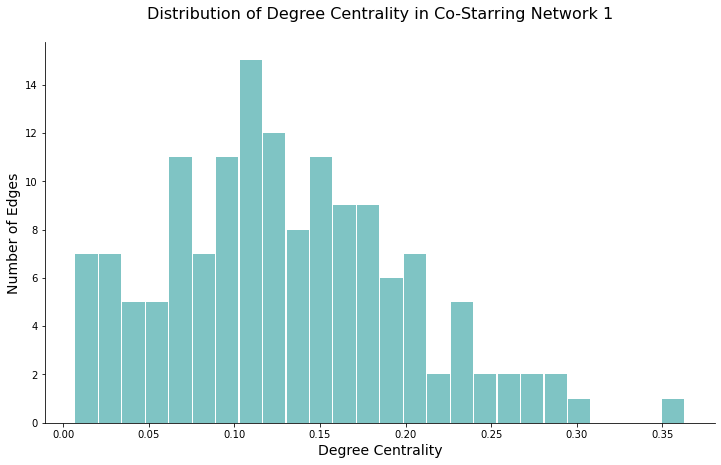

In [45]:
measureStats(g1, dict(g1.degree()), "Degree")
print("\n")
measureStats(g1, nx.degree_centrality(g1), "Degree Centrality", r=3)
histogram(g1, 1, 26, nx.degree_centrality(g1), "Degree Centrality")

The degree range from 1 to 53, or a degree centrality range of 0.7% to 36% (recall that we previously removed any nodes of degree 0). The distribution looks approximately bell shaped (normal) with a skew to the right. At a first glance we can see that very few nodes have a very high degree centrality score, quite a few have a very low degree centrality score, and the majority have a score somewhere in the middle.

Around 16% of nodes, or 24 nodes, have a degree centrality score below about 6.5%. Therse nodes have less than about 10 direct connections. 

66%, or 98 nodes, have degree centrality between 5% and 20%, with 30% between 10% and 15%.

17% have a degree centrality score above 20%. These are nodes with a very large number of direct connections, with connections to about 30+ nodes. We can see one node with a very high score of 36%, or 53 connections. This is an important node as it has a very large neighbourhood of nodes.

To further visualise the degree we can plot the network diagram, where the size and colour of each node indicates the degree centrality for that node. I will label the nodes with the highest degree / degree centrality.

Name:  Liam Neeson 
Degree Centrality:  0.363 
Degree:  53 

Name:  Robert De Niro 
Degree Centrality:  0.295 
Degree:  43 

Name:  Willem Dafoe 
Degree Centrality:  0.288 
Degree:  42 



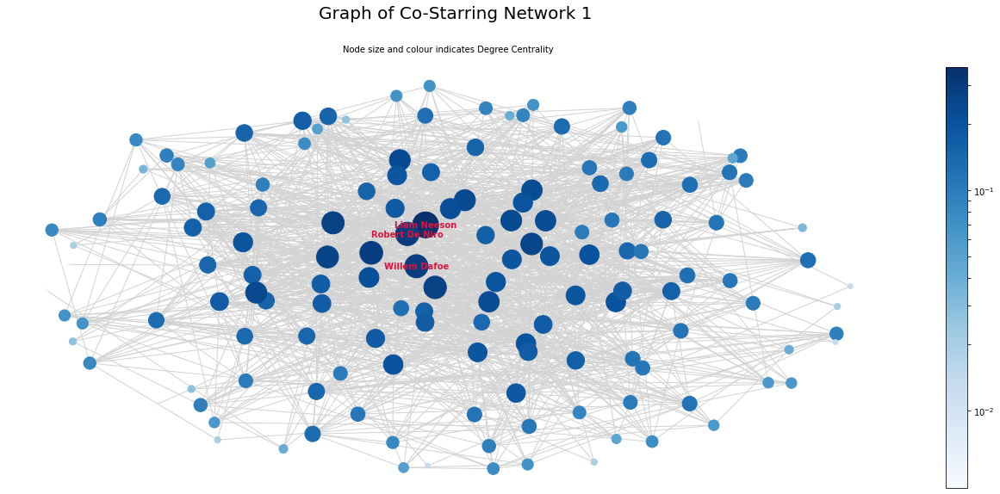

In [46]:
degree=actorsWithHighestOfMeasure(g1, dict(g1.degree()), 3)
degreeCentrality=actorsWithHighestOfMeasure(g1, nx.degree_centrality(g1), 3)

for actor in degreeCentrality.iteritems():
    print("Name: ", g1.nodes[actor[0]]["name"], "\nDegree Centrality: ", round(actor[1],3), "\nDegree: ", g1.degree[actor[0]], "\n")
    
pos = nx.spring_layout(g1, seed=675, k=1.6)
draw(g1, pos, nx.degree_centrality(g1), 'Degree Centrality', 1, 2500, list(degreeCentrality.index), 10, 23, 9)

We can see that Liam Neeson has the highest degree centrality of 0.363, i.e. the most direct connections, with degree 53 (53 edges). This is followed by Robert De Niro with degree centrality 0.295 (degree 43) and William Dafoe with degree centrality 0.288 (degree 42).

Intuitively, a node with more edges, in this case representing an actor with more ties, is more important than a node with only one edge. Degree centrality is local and depends only on the node neighbourhood. A node with a high degree centrality may be capable of affecting a lot of neighbours in its neighbourhood at once, but we cannot say anything about the opportunities for global outreach. We will look at global centrality measures also, but first we can extend degree to look at weighted degree.

__Weighted Degree__

Recall that each edge in our network has a weight, which for each is the number of movies the two actor acted together in.

We can take these edge weights into account when computing centrality values.

The weighted degree of a node is the sum of the weights on the edges connected to that node.

Degree quantifies the number of unique connections a node has. If an actor has worked with another actor in one movie, this adds 1 to their degree. If the actor worked with this actor in 20 different movies, this still just adds 1 to their degree. Weighted degree, however, adds 1 for every movie that an actor worked in with every other actor. There are benefits to both degree metrics. Nodes with a very high weighted degree may have few direct connections, but have acted in many movies with the few actors they are connected to, meaning that they are not very influential nodes, so in terms of influence in the network degree centrality may be a better measure.

For indentifying clusters in the network, weighted degree may be helpful, as it would identify groups of actors who worked in many movies together, for example actors who worked on film series together.

We can start by adding an attributed "weightedDegree" to each node.

In [47]:
def weightedDegree(g):
    
    # nodes in the network to a Pandas DataFrame
    df = pd.DataFrame(g.nodes(), columns = ["node"])

    for node in g.nodes():

        weightedDegree = 0
        
        # for each edge connected to the node
        for edge in g.edges([node], data=True):
            
            # sum weight of each edge
            weightedDegree += edge[2]["weight"]
            
            # set weightedDegree node attribute for the node
        g.nodes[node]["weightedDegree"] = weightedDegree 

weightedDegree(g1)

We can now plot a histogram of the weighted degrees.

Weighted Degree Summary Statistics:

Min:  1
Max:  101 

Mean:  28.0
Median:  23.0


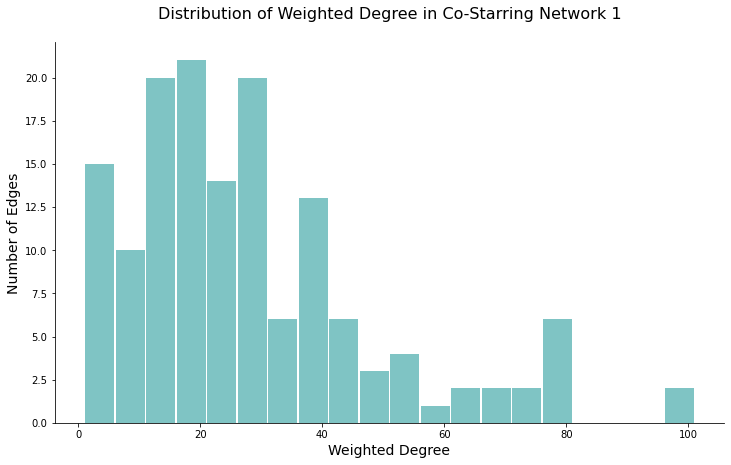

In [48]:
measureStats(g1, nx.get_node_attributes(g1, "weightedDegree"), "Weighted Degree")
histogram(g1, 1, 20, nx.get_node_attributes(g1, "weightedDegree"), "Weighted Degree")

From the histogram and summary stats above we can see that the range of weighted degree values is from 0 to 101. The highest peak can be seen at around 16-20, with a count of about 21. A peak can also be seen at around weighted degree 1-5. 

The shape of the histogram is very similar to that of the degree histogram. Once again most of the values are in or around the mean, which is in this case 27. We can see that about 51% (22+14+20+6+13 / 147) of the values are within +- 10 of the mean (17 - 37). About 30% of the values are below this (20+10+15/147), leaving less than 20% of the weighted degree values over 40%. 2 of the values are between about 98 and 101.

We can now look at the actors who have the highest weighted degrees and plot our network diagram, where the size and colour of the nodes indicate the weighted degree.

Actor, Weighted Degree:
Michael Gambon 101
Alan Rickman 98
Mark Williams 79
David Thewlis 79


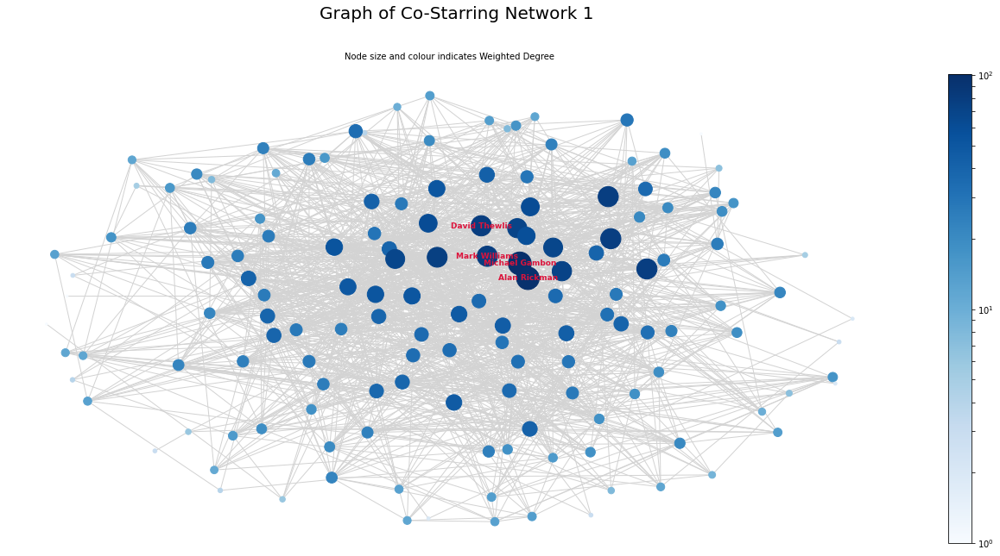

In [49]:
highestWeightedDegrees = actorsWithHighestOfMeasure(g1, nx.get_node_attributes(g1, "weightedDegree"), 4)

print("Actor, Weighted Degree:")
for actor in highestWeightedDegrees.iteritems():
    print(g1.nodes[actor[0]]["name"], actor[1])

highestWeightedDegrees = list(highestWeightedDegrees.index)
pos = nx.spring_layout(g1, seed=675, k=1.5)
draw(g1, pos, nx.get_node_attributes(g1, "weightedDegree"), 'Weighted Degree', 1, 7, highestWeightedDegrees, 9, 23, 10)

We can see that the actors with the highest weighted degrees are Michael Gambon, Alan Rickman, Mark Williams, David Thewlis, which have weighted degrees of 101, 98, 79 and 79 respectively. 

These are all very famous actors who are well known for playing Professor Dumbledore, Professor Snape, Arthur Weasley and Remus Lupin in the Harry Potter film series. There are 8 Harry Potter movies, and the movies tend to have a lot of the same actors in each, so one would expect that the connections between these actors and the other actors in the Harry Potter movies which are in this dataset would have high weights. These are also older actors who have been in the movie industry for many years so it is unsurprising for them to have a lot of direct connections with other actors. 

It is unlikely for many actors to act in a very large amount of movies with the same actors when the movies are unrelated. Thus it is likely that many of the actors with the highest weighted degrees have acted in large film series, such as Star Wars, Harry Potter, etc, as these actors would have edges with high weights with their costars in these film series. 

__Eigenvector Centrality__

Eigenvector centrality attempts to capture the qualitative aspect of the connections of a vertex. It is a basic extension of degree centrality, which defines centrality of a node as proportional to its neighbors’ importance. When we sum up all connections of a node, not all neighbors are equally important and eigenvector centrality takes this into account. 

Eigenvector centrality is a more sophisticated view of centrality where a person with few connections could have a very high eigenvector centrality if those few connections were to very well-connected others. It allows for connections to have a variable value, so that connecting to some vertices has more benefit than connecting to others

For eigenvector centrality, relative scores are assigned to all nodes in the network based on the concept that connections to high-scoring nodes contribute more to the score of the node in question than equal connections to low-scoring nodes. Mathematically, the eigenvector centrality of a node is the sum of the neighbors’ eigenvector centralities divided by λ — the largest eigenvalue of the adjacency matrix of the network. 

High eigenvector centrality identifies nodes that are surrounded by other nodes with high eigenvector centrality. This can be used to locate clusters/groups of interconnected nodes with high prestige.

Eigenvector Centrality Summary Statistics:

Min:  0.0
Max:  0.209 

Mean:  0.071
Median:  0.067


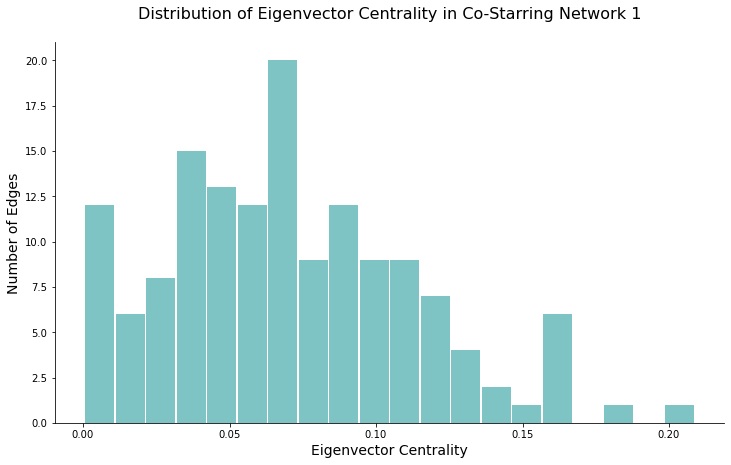

In [50]:
measureStats(g1, nx.eigenvector_centrality(g1), "Eigenvector Centrality", 3)
histogram(g1, 1, 20, nx.eigenvector_centrality(g1), "Eigenvector Centrality")

The range of values for eignevector centrality is 0 - 0.209.

We can immediately see that once again the shape of the distribution is quite similar to that of the distribution of degree and weighted degree. The distribution is bimodal with a peak at 0-0.01 and 0.06-0.07, and a skew to the right. 

About 6% (6+1+1+1/147) of the values for eigenvector centrality are above 0.15. There is one node with eigenvector centrality above 0.2 and one node with a value of about 0.18.

The mean eigenvector centrality value is 0.071, and the median is 0.067.

There are a small number of nodes which have a high eigenvector centrality, important nodes, and these are nodes who are connected to other important nodes with high eigenvector centrality scores. 

Actor, Eigenvector Centrality:
Liam Neeson 0.21
Julianne Moore 0.18
Robert De Niro 0.17


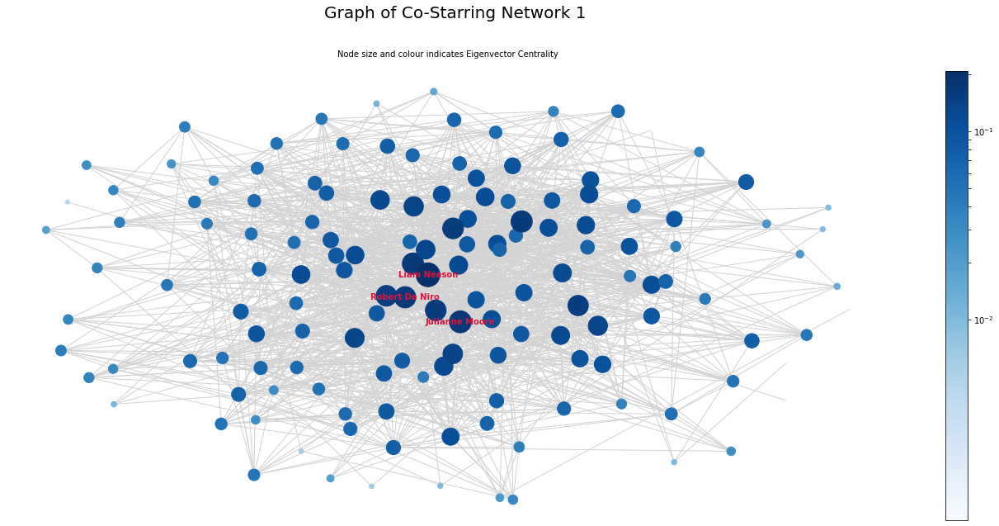

In [51]:
highestEigenvector = actorsWithHighestOfMeasure(g1, nx.eigenvector_centrality(g1), 3)

print("Actor, Eigenvector Centrality:")
for actor in highestEigenvector.iteritems():
    print(g1.nodes[actor[0]]["name"], round(actor[1], 2))

pos = nx.spring_layout(g1, seed=700, k=1.3)
draw(g1, pos, nx.eigenvector_centrality(g1), 'Eigenvector Centrality', 1, 4000, list(highestEigenvector.index), 10, 24, 10)

The actor with the highest eigenvector centrality is Liam Neeson, wtih an eigenvector centrality value of 0.21. We saw previously that Liam Neeson also has the highest degree. A high degree does not always guarntee a high eigenvector centrality, as the connections may not be very important, however here we can see that Liam Neeson is connected with other important nodes in the network.

Julianne Moore has the 2nd highest eigenvector centrality, 0.18, followed by Robert De Niro with 0.17.

__Betweenness Centrality__

This metric captures a different view of the importance of a node. The previous centrality measures do not capture the idea of brokerage. Betweenness centrality identifies strategic linkages, “brokers” or “bridging nodes” in a network. It finds the bottleneck nodes in a network.

Nodes that occur on many shortest paths between other nodes in the network have a high betweenness centrality score.

Betweenness centrality assumes that the nodes which connect most of the other nodes in the shortest possible way are most important.

As mentioned previously, many of the other centrality metrics, such as degree centrality, are local and depend only on the neighbourhood of a node, but we cannot say much about the opportunities for global outreach from these metrics. Betweenness centrality is a global metric. If the betweenness centrality of a node is high, the node is potentially a crucial go-between and has a brokerage capability. The removal of such a node would disrupt communications, lower closeness centralities, and possibly split the network into disconnected components. Thus, it is a very important centrality metric.

Betweenness Centrality Summary Statistics:

Min:  0.0
Max:  0.043 

Mean:  0.008
Median:  0.005


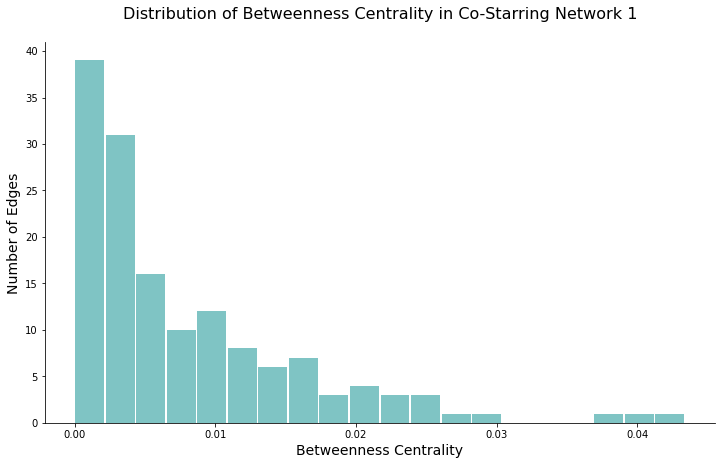

In [52]:
measureStats(g1, nx.betweenness_centrality(g1), "Betweenness Centrality", 3)
histogram(g1, 1, 20, nx.betweenness_centrality(g1), "Betweenness Centrality")

Here we can see a very different distribution to the other centrality measures.The values range from 0 to 0.043. There is a peak at the minimum value, 0, and major skew to the right. About 60% (10+16+31+38/147) of the values are below the mean of 0.008. Around another 38% of the values are between 0.008 and 0.04, with just 2% above 0.04.

So, there are very few nodes with very high betweenness centrality scores, which are nodes that occur on a very large number of shortest paths. We can plot out network diagram and identify these nodes.

Actor, Betweenness Centrality:
Liam Neeson 0.0434
Willem Dafoe 0.0411
Robert De Niro 0.0383


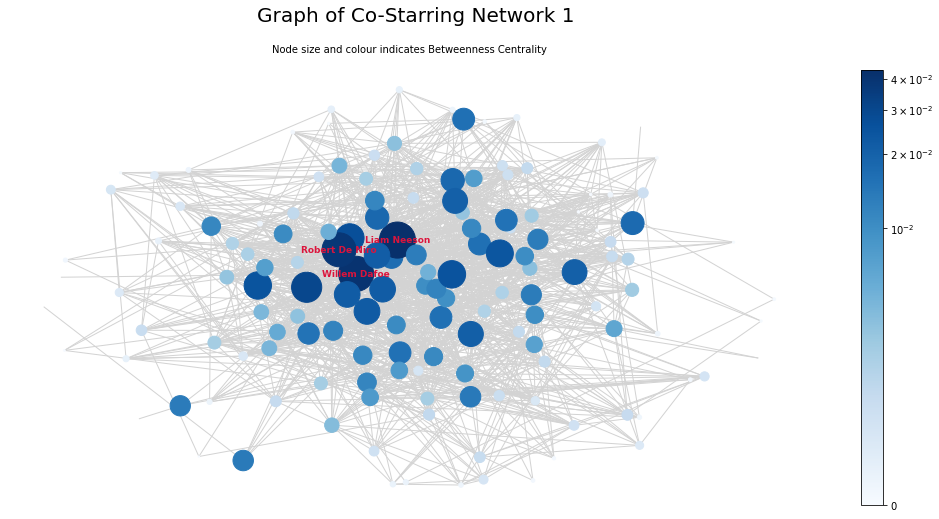

In [53]:
highestBetweenness = actorsWithHighestOfMeasure(g1, nx.betweenness_centrality(g1), 3)

print("Actor, Betweenness Centrality:")
for actor in highestBetweenness.iteritems():
    print(g1.nodes[actor[0]]["name"], round(actor[1], 4))
    

pos = nx.spring_layout(g1, seed=675, k=1.2)
draw(g1, pos, nx.betweenness_centrality(g1), 'Betweenness Centrality', 1, 30000, list(highestBetweenness.index))

Once again we can see that Liam Neeson has the highest centrality score for betweenness centrality with a score of 0.0434. This is followed by Willem Dafoe with 0.0411 and Robert De Niro with 0.0383. These are very central nodes with a lot of direct connections. It is therefore unsurprising that they would have high betwenness centrality, as they would likely appear on many shortest paths, acting as brokers between many nodes.

We can also see nodes on the outskirts of the diagram, nodes with few direct connections (low degree) which have a high betweenness centrality score. These nodes are connected to other nodes with very few direct connections, and so removing these nodes may result in isolating some of their connections. Thus, they are important brokers in the network.

__Closeness Centrality__

The closeness centrality of a node is defined as the reciprocal mean distance from the node to all other reachable nodes in the network. It shows how close the node is to the rest of the graph. This is again a global metric as it does not depend only on the nodes neighbourhood.

It is calculated as 1 / the average of the shortest path length from the node to every other node in the network.

Closeness centrality indicates nodes as more central if they are closer to most of the nodes in the graph. This strongly corresponds to visual centrality — a node that would appear toward the center of a graph when we draw it usually has a high closeness centrality. Closeness can be regarded as a measure of how fast it will take to spread information to all other nodes. If a node has high closeness centrality, it is in a position to spread information quickly. These nodes can be important influencers of the network. It highlights nodes that may reach any other nodes within a few hops and nodes that may be very distant in the graph.

Closeness Centrality Summary Statistics:

Min:  0.274
Max:  0.593 

Mean:  0.477
Median:  0.487


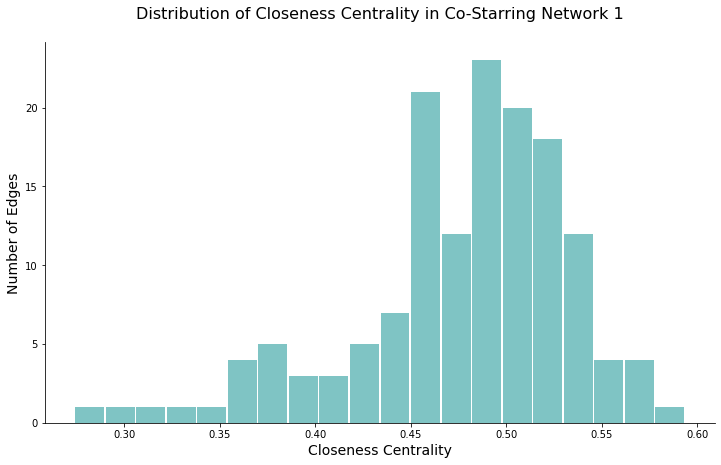

In [54]:
measureStats(g1, nx.closeness_centrality(g1), "Closeness Centrality", 3)
histogram(g1, 1, 20, nx.closeness_centrality(g1), "Closeness Centrality")

Closeness centrality has an approximately normal distribution with a slight skew to the left. The distribution is quite different to the other centrality metrics. For the previous centrality measures we typically saw a distribution entirely skewed to the right, or an approximately normal distribution with a right skew. So for most other metrics there were few nodes with very high values. Here however, fewer nodes have very low values. About 11% of nodes have a closeness centrality score below 0.4. About 64% have a score between 0.45 and 0.55, and around 6% have a score above this. The range of values is from 0.274 to 0.593, with a mean of 0.477.

To visualise this we can once again draw our network graph.

Actor, Closeness Centrality:
Liam Neeson 0.5935
Robert De Niro 0.5703
Willem Dafoe 0.5681


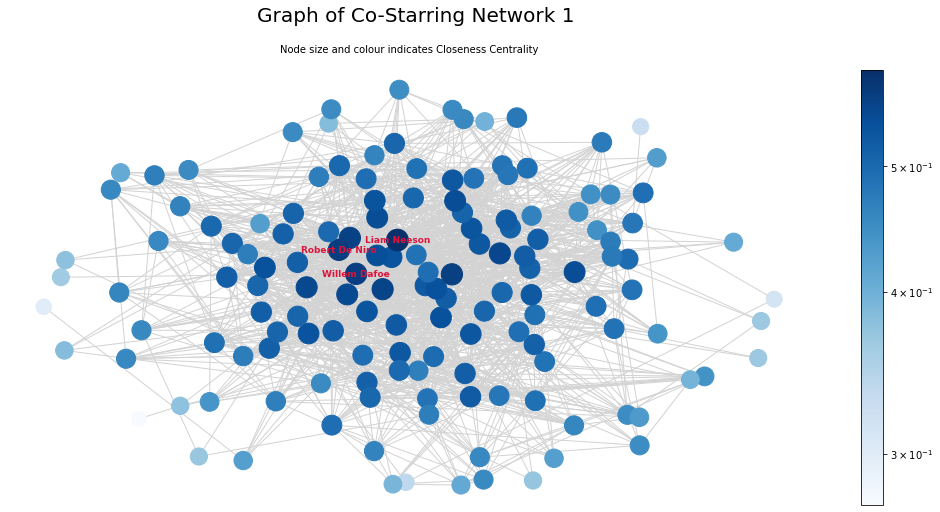

In [55]:
highestCloseness = actorsWithHighestOfMeasure(g1, nx.closeness_centrality(g1), 3)

print("Actor, Closeness Centrality:")
for actor in highestCloseness.iteritems():
    print(g1.nodes[actor[0]]["name"], round(actor[1], 4))
    

pos = nx.spring_layout(g1, seed=675, k=1.2)
draw(g1, pos, nx.closeness_centrality(g1), 'Closeness Centrality', 1, 800, list(highestCloseness.index))

For previous metrics we typically saw a few nodes which were very large, and most other nodes were much smaller. Here however we can see that the majority of nodes are quite large, with a small number of smaller nodes indicating a smaller closeness centrality. This tells us that most of our nodes are a similar short distance to all other nodes, with a small number of nodes which are a larger distance on average to all other nodes. 

We can see that Liam Neeson, Robert De Niro and Willem Dafoe have the highest scores of 0.5935, 0.5703 and 0.5681. These are the closest to all other nodes on average.

I have now looked at various centrality measures for my first network, in an attempt to identify important and influential nodes in the network. I will now do the same for the second network.

# <font color='cadetblue'>Task 2: Network 2</font>
### <font color='cadetblue'>(i) Characterise the structure and connectivity of the network</font>

Next I will move onto the network from the second dataset, and begin by characterising the structure and connectivity.

I will start by looking at the number of nodes and edges in the network.

__Number of nodes and edges__

In [56]:
numberEdgesAndWeights(g2)

Number of nodes:  160
Number of edges:  1543


__Weight Distribution__

Next I will look at the disribution of the edge weights.

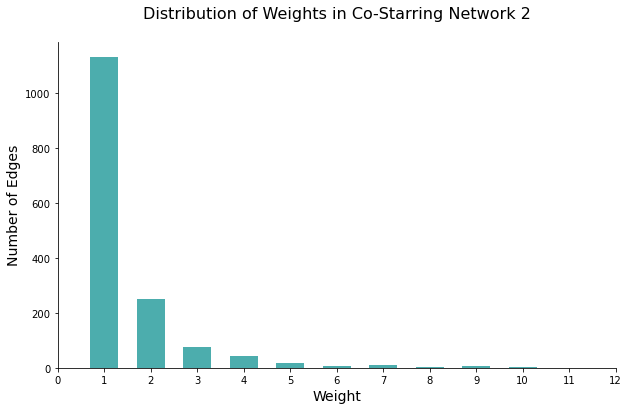

In [57]:
weightDistribution(g2, 2)

The range of weights is from 1 to 10, meaning the most movies that any two actors in the data set were in together is 10 movies. About 73% of the edges have a weight a weight of 1, so 73% of the actor pairs who were in a movie together were only in 1 movier together, with only 27% being in over 1 movie together. 25% of the edges have a weight of between 2 and 5, leaving only 2% with a weight of between 6 and 10.

Thus, the majority of the weights are very low, with most actors acting in only a few movies with the same actors, with few high weights for actors who acted in a large number of movies with the same actors.

This can be seen in the network diagram below, where edge width and colour indicates weight.

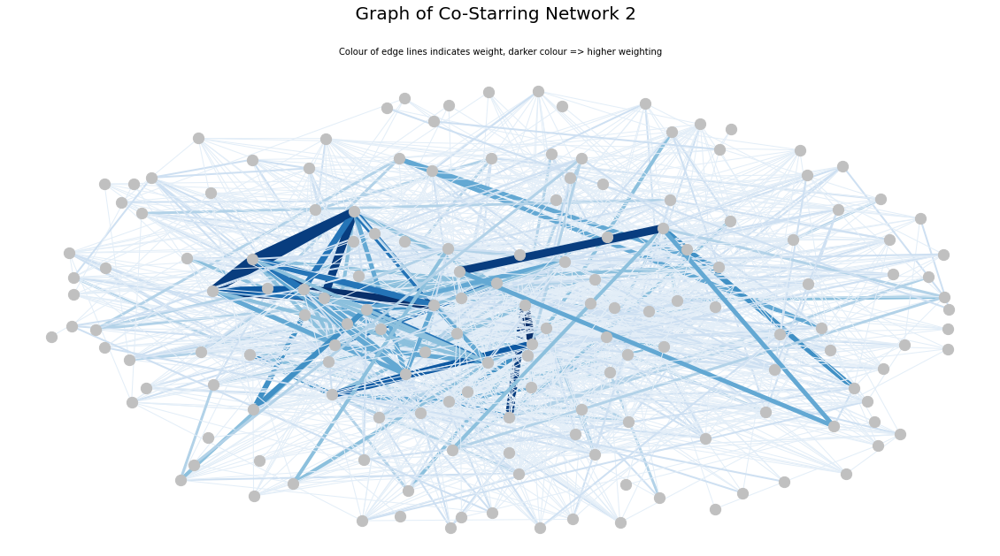

In [58]:
weightDiagram(g2, 2)

As expected, there are few high weights (dark, wide edges), and the majority of edges have a low weight (thin, light coloured edges).

__Network Density__

Next we can look at network density. Network density refers to the portion of potential edges between nodes in a network that exist as actual edges.

Density is calculated numerically as the ratio of existing edges over the total number of potential edges between all pairs of nodes.

In [59]:
networkDensity(g2)

Number of potential edges:  12720
Number of actual edges:  1543
Network Density:  12.13 %



The network is quite sparse with a network density of only 12%. Only 12% of the possible edges between nodes are actual edges.

Next we can check if our network is connected. An undirected network is connected if there is a path between every pair of nodes in the network. 

In [60]:
print("Network 2 is connected: ", nx.is_connected(g2))

Network 2 is connected:  True


Our network is fully connected, and so there is only one connected component.

In [61]:
print("Number of connected components: ", nx.number_connected_components(g2))

Number of connected components:  1


__Network Diameter__

A network’s diameter is the maximum distance between all pairs of its nodes - i.e. the longest shortest path in the entire network. The diameter tells us how quickly information can be transmitted across the entire network. The higher the diameter, the less linked a network tends to be.

The diameter of the network will be infinite if the network is not fully connected. We know from above that our network is connected.

We can calculate the diameter using the networkx function nx.diameter().

In [62]:
print("Network 2 Diameter: ", nx.diameter(g2))

Network 2 Diameter:  6


We can see that network 2 has a diameter of 6. This means that the longest distance between any two nodes in the network, taking the shortest path possible, is 6, i.e. max of 6 edges must be crossed to get from one node to any other in the network.

We can visualise this by plotting our network graph and marking the longest shortest-path (there may be more than one path of this distance, we will mark one such path)

In [63]:
path=longestShortestPath(g2)

Longest Shortest Path =  ['0240318', '0914455', '0350454', '0000995', '0000244', '4881749', '0653669']

Path Length == Diameter: True


As expected, we can see that the longest shortes-path is of length 6. We can now plot our graph and mark each edge and node along the shortest path, as well as labelling the nodes with the actors names. Once again there may be more than 1 shortest path of this length so we will plot one such path.

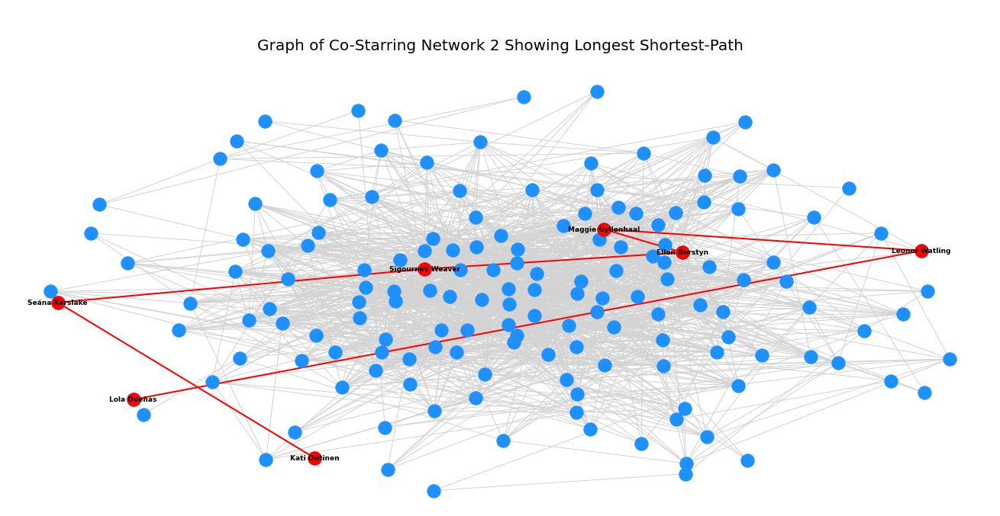

In [64]:
pos = nx.spring_layout(g2, seed=675, k=1)
drawDiameter(g2, pos, 2, path, path[0], path[len(path)-1])

 We can clearly see that the longest shortest path is of length 6.

__Clustering Coefficient__

Clustering coefficient indicates the level of concentration of edges in the neighbourhood of a node.
It is the fraction of pairs of its neighbours that have edges between one another - i.e. how many closed triads around this node.

(Closed triad = if a node A is connected to nodes B and C, and B and C are also connected, then A, B and C form a closed triad.)

We can calculate the average clustering coefficient of all of the nodes in the network.

In [65]:
print("Average Clustering Coefficient: ", round(nx.average_clustering(g2), 3))

Average Clustering Coefficient:  0.31


So, on average about 31% of pairs of a nodes neighbours have edges between them.

### <font color='cadetblue'>(ii) Apply Centrality Measures to identify important nodes in the network</font>

Centrality quantifies how important nodes are in a network.

__Degree & Degree Centrality__

We can begin by looking at degree centrality. The degree of a node is the number of edges ending at that node – i.e. the number of direct connections it has in the network.

We can calculate the degree centrality for each node by normalising the degree of each node (by dividing by the maximum possible degree in the network, n-1, where n is the number of nodes in the network).

Degree and degree centrality can help to identify influential nodes as nodes with a high degree are directly connected to a large number of other nodes.

Intuitively, a node with more edges, in this case representing an actor with more ties, is more important than a node with only one edge. As mentioned for network 1, degree centrality is local and depends only on the node neighbourhood. A node with a high degree centrality may be capable of affecting a lot of neighbours in its neighbourhood at once, but we cannot say anything about the opportunities for global outreach.

First we will look at the distribution of the node degree centrality scores by plotting a histogram.

Degree Summary Statistics:

Min:  1
Max:  49 

Mean:  19.0
Median:  18.0


Degree Centrality Summary Statistics:

Min:  0.006
Max:  0.308 

Mean:  0.121
Median:  0.113


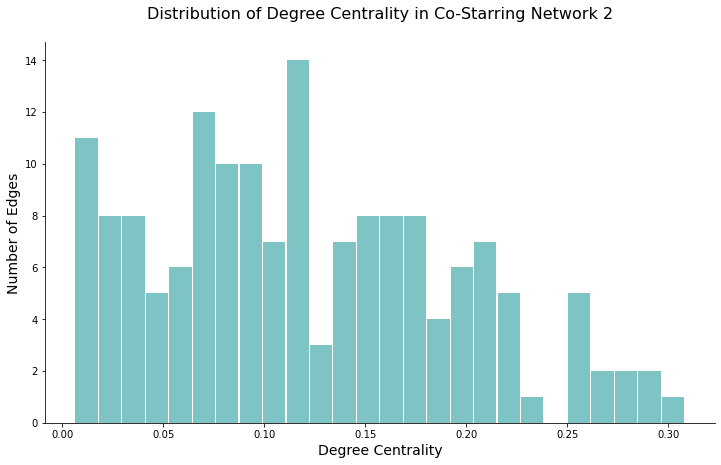

In [66]:
measureStats(g2, dict(g2.degree()), "Degree")
print("\n")
measureStats(g2, nx.degree_centrality(g2), "Degree Centrality", r=3)
histogram(g2, 2, 26, nx.degree_centrality(g2), "Degree Centrality")

The degree range from 1 to 49, or a degree centrality range of 0.6% to 30% (recall that we previously removed any nodes of degree 0).

20% of nodes, or 32 nodes, have a degree centrality score below about 5%. Therse nodes have less than about 8 direct connections. 

23%, or 38 nodes, have degree centrality between 5% and 10% (about 8-16 connections)

About 48% have degree centrality between 10% and 25%, leaving 8% with a degree centrality score above 25%. These nodes have more than 40 connections. These are important nodes as they have very large neighbourhoods of nodes.

The mean degree centrality score is 12%, about 19 direct connections.

To further visualise the degree we can plot the network diagram, where the size and colour of each node indicates the degree centrality for that node. I will label the nodes with the highest degree / degree centrality.

The distribution is approximately bimodal, with a peak at around 0.006 and 0.12. The largest number of nodes have a degree within about 5% of the average. A considerable amount have a very low degree, and less have a very high degree, however there are still quite a few nodes with a high degree.

Name:  Meryl Streep 
Degree Centrality:  0.308 
Degree:  49 

Name:  Susan Sarandon 
Degree Centrality:  0.296 
Degree:  47 

Name:  John Lithgow 
Degree Centrality:  0.289 
Degree:  46 



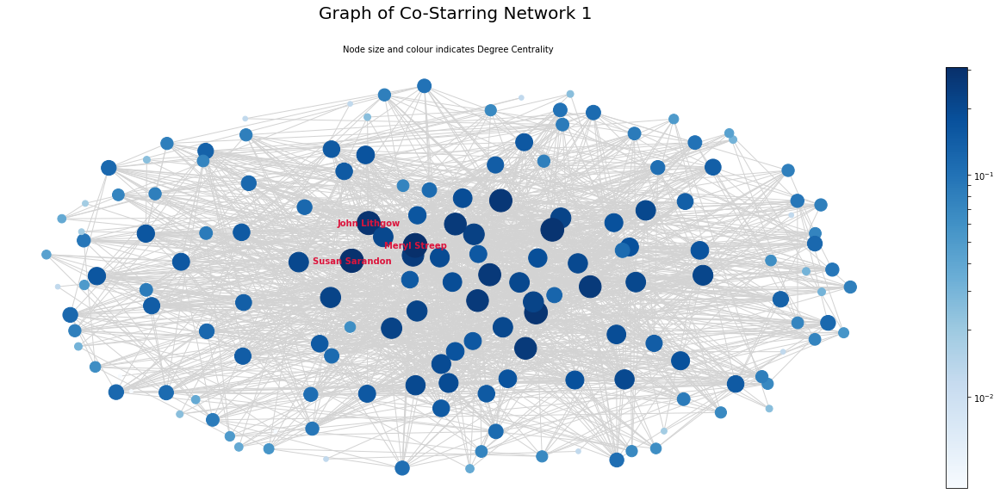

In [67]:
# degree=actorsWithHighestOfMeasure(g2, dict(g2.degree()), 3)
degreeCentrality=actorsWithHighestOfMeasure(g2, nx.degree_centrality(g2), 3)

for actor in degreeCentrality.iteritems():
    print("Name: ", g2.nodes[actor[0]]["name"], "\nDegree Centrality: ", round(actor[1],3), "\nDegree: ", g2.degree[actor[0]], "\n")
    
highestDegrees = list(degreeCentrality.index)

pos = nx.spring_layout(g2, seed=675, k=1.7)
draw(g2, pos, nx.degree_centrality(g2), 'Degree Centrality', 1, 2500, highestDegrees, 10, 23, 9)

As expected, we can see from the diagram that there are a small number of nodes with high degrees, most nodes have a degree near the average, and quite a large number have a very low degree. Meryl Streep has the highest degree centrality score of 0.308 with 49 edges, followed by Susan Sarandon with degree centrality score of 0.296 and degree 47, and John Lithgow with 0.289 and degree 46. These are influential nodes in the network as they have the largest number of direct connections with other actors.

__Weighted Degree__

Next can take these edge weights into account and compute the weighted degrees. The weighted degree of a node is the sum of the weights on the edges connected to that node.

We can start by adding the node attribute "weightedDegree" to each node in the network using the previously defined function from network 1.

In [68]:
weightedDegree(g2)

The weightedDegree attribute was added successfully:

In [69]:
print(g2.nodes["0000241"])

{'name': 'Jean-Claude Van Damme', 'born': '1960-10-18', 'weightedDegree': 20}


Now we can plot a histogram to inspect the distribution of weighted degrees.

Weighted Degree Summary Statistics:

Min:  1
Max:  91 

Mean:  29.0
Median:  24.0


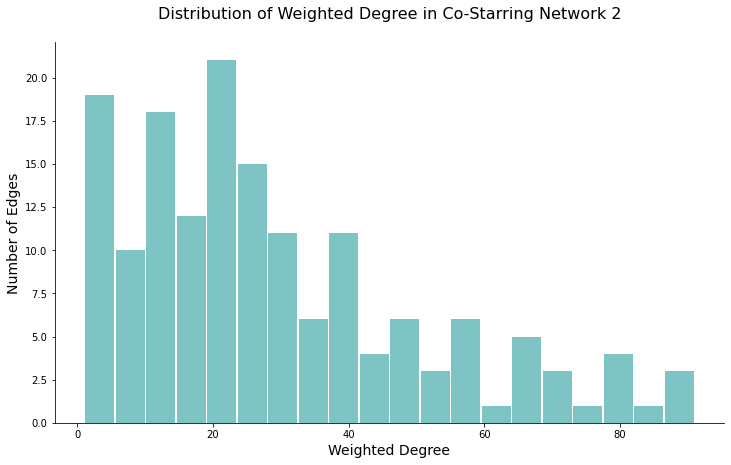

In [70]:
measureStats(g2, nx.get_node_attributes(g2, "weightedDegree"), "Weighted Degree")
histogram(g2, 2, 20, nx.get_node_attributes(g2, "weightedDegree"), "Weighted Degree")

I was surprised by the amount of nodes which had a large degree when looking at the degree centrality histogram. This histogram for the weighted degree better fits my expectations. We can see that a very large number of nodes have a smaller weighted degree, with much less concentration of values at the larger weighted degrees. This might indicate that although a larger number of actors in the network have acted in movies with a lot of other actors in the dataset, a lot of them may have acted in a very small number of movies with each of these actors, which would give them a smaller weighted degree, while few actors have acted in a very large number of movies with a large number of different actors in the dataset, giving a few actors a very large weighted degree.

The range of weighted degrees is 1 to 91, with a mean of 29 and median of 24. Approximately 64% of the nodes have a below average weighted degree (18.5+10+18+11+21+15+10/160). About 11% (1+3+5+1+4+1+3/160) have a weighted degree above 60, with only 5% having a weighted degree of 80 or above (4+1+3/160).

The overall distribution looks approximately bimodal with a peaks at 1-5 and 20-25 with a skew to the right.

We can plot our network diagram with node size and colour indicating weighted degree to further visualise this.

Actor, Weighted Degree:
Maggie Smith 91
Ralph Fiennes 88
Julie Walters 88


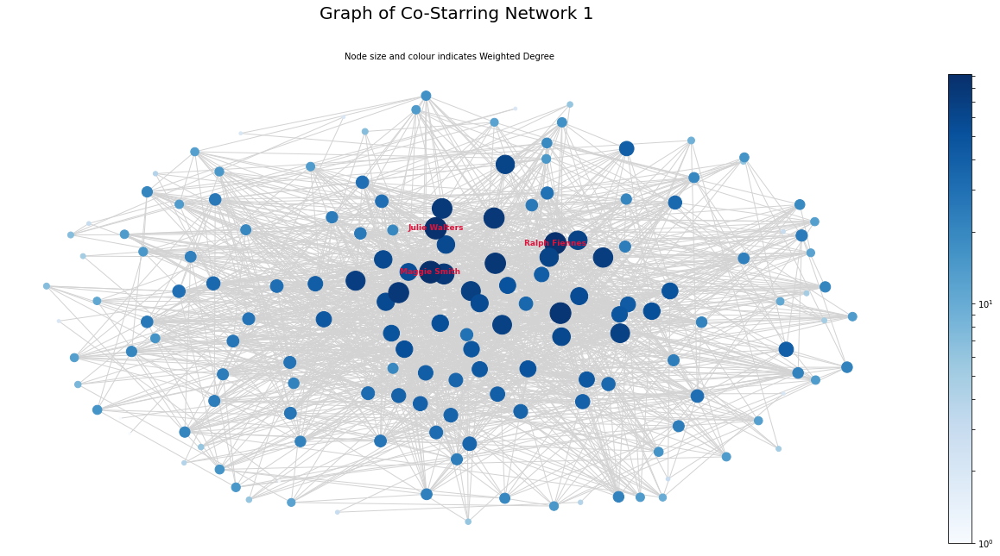

In [71]:
highestWeightedDegrees = actorsWithHighestOfMeasure(g2, nx.get_node_attributes(g2, "weightedDegree"), 3)

print("Actor, Weighted Degree:")
for actor in highestWeightedDegrees.iteritems():
    print(g2.nodes[actor[0]]["name"], actor[1])

highestWeightedDegrees = list(highestWeightedDegrees.index)
pos = nx.spring_layout(g2, seed=675, k=1.5)
draw(g2, pos, nx.get_node_attributes(g2, "weightedDegree"), 'Weighted Degree', 1, 7, highestWeightedDegrees, 9, 23, 10)

Maggie Smith has the highest weighted degree of 91, followed by Ralph Fiennes with 88 and Julie Walters also with 88.

We can see a much smaller number of large nodes in this diagram in comparison to the degree centrality diagram, and a larger number of small nodes. The larger nodes are all again very central as they have a large number of edges.

Interestingly, we can see that none of the actors with the top 3 degree centrality scores are in the top 3 highest weighted degree scores. So although these 3 actors have been in movies with less different actors in the dataset they must have been in a larger number of movies with the same actors. As with network 1, all three of these actors appeared in the Harry Potter film series, which means they may have been in up to 8 movies with any other actors in the dataset who appeared in the Harry Potter films, and they are also very famous actors and actresses who starred in many more movies throughout the years. Thus, it is not unsurprising for them to have high weighted degree scores.

__Eigenvector Centrality__

Next we can look at eigenvector centrality for the network, which is a basic extension of degree centrality which defines centrality of a node as proportional to its neighbors’ importance. When we sum up all connections of a node, not all neighbors are equally important and eigenvector centrality takes this into account by capturing the qualitative aspect of the connections of a vertex.

For eigenvector centrality, relative scores are assigned to all nodes in the network based on the concept that connections to high-scoring nodes contribute more to the score of the node in question than equal connections to low-scoring nodes. Mathematically, the eigenvector centrality of a node is the sum of the neighbors’ eigenvector centralities divided by λ — the largest eigenvalue of the adjacency matrix of the network. 

We can begin by looking at the distrubution of eigenvector centrality scores by plotting a histogram.

Eigenvector Centrality Summary Statistics:

Min:  0.0
Max:  0.178 

Mean:  0.066
Median:  0.063


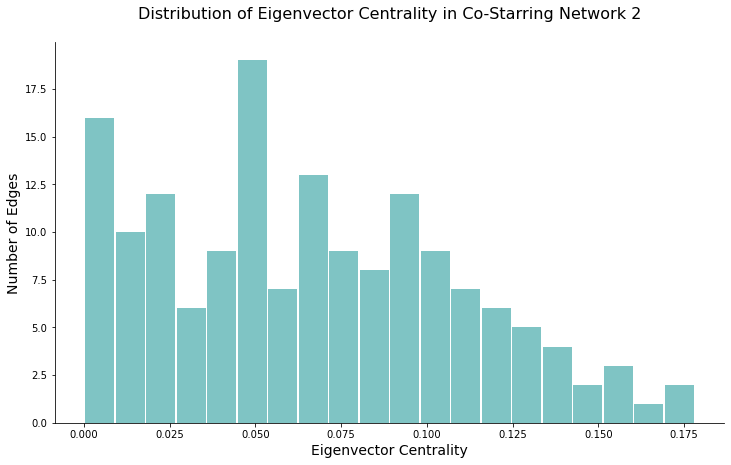

In [72]:
measureStats(g2, nx.eigenvector_centrality(g2), "Eigenvector Centrality", 3)
histogram(g2, 2, 20, nx.eigenvector_centrality(g2), "Eigenvector Centrality")

The range of values for eignevector centrality is 0 - 0.178, with a mean of 0.066 and median of 0.063. 

The distribution once again looks approximately bimodal with a peak at about 0-0.01 and 0.04-0.0525, and a slight skew to the right. 

About 48% (16+10+11+6+8+20+6/160) of the eigenvector centrality scores are below the mean. Almost 25% of the nodes have an eigenvector centrality score of above 0.1 (9+7+6+5+4+2+3+1+2/160). 

So quite a large number of nodes have a high eigenvector centrality score, indicating that these nodes are connected to other important nodes. 

To visualise this we can once again look at our network diagram and let node size and colour indicate eigenvector centrality.

Actor, Eigenvector Centrality:
Meryl Streep 0.178
Susan Sarandon 0.176
John Lithgow 0.165


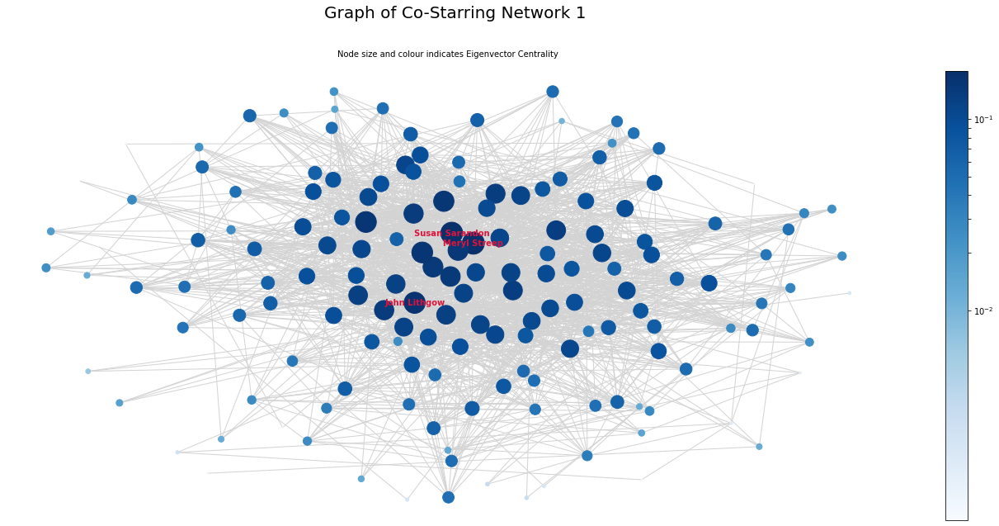

In [73]:
highestEigenvector = actorsWithHighestOfMeasure(g2, nx.eigenvector_centrality(g2), 3)

print("Actor, Eigenvector Centrality:")
for actor in highestEigenvector.iteritems():
    print(g2.nodes[actor[0]]["name"], round(actor[1], 3))

pos = nx.spring_layout(g2, seed=700, k=1.2)
draw(g2, pos, nx.eigenvector_centrality(g2), 'Eigenvector Centrality', 1, 4000, list(highestEigenvector.index), 10, 24, 10)

As expected, we can see a large number of nodes with quite high eigenvector centrality scores. These nodes are all very central and have a lot of direct connections. It is probable that many of these actors who have a high degree scores (i.e. have been in movies with a large number of other actors) have acted with other actors who too have high degree scores, and so many of the important nodes are connect, giving them high eigenvector centrality scores.

We can see a large number of nodes with lower eigenvector centrality scores on the outskirts of the network. These are nodes with less connections, and the connections they do have are no to important nodes, which would give them lower eigenvector centrality scores.

Meryl Streep has the highest eigenvector centrality score of 0.178, followed by Susan Sarandon with 0.176 and John Lithgow with 0.165. These 3 actors also had the 3 highest degree scores, i.e. they were in movies with the largest number of different actors in the dataset. Many of the actors in the dataset that they acted with must too have been important influential nodes in the network, giving them high eigenvector centrality scores.

__Betweenness Centrality__

This metric captures a different view of the importance of a node. The previous centrality measures do not capture the idea of brokerage. Betweenness centrality identifies strategic linkages, “brokers” or “bridging nodes” in a network. It finds the bottleneck nodes in a network.

Nodes that occur on many shortest paths between other nodes in the network have a high betweenness centrality score.

Betweenness centrality assumes that the nodes which connect most of the other nodes in the shortest possible way are most important.

As mentioned previously, many of the other centrality metrics, such as degree centrality, are local and depend only on the neighbourhood of a node, but we cannot say much about the opportunities for global outreach from these metrics. Betweenness centrality is a global metric. If the betweenness centrality of a node is high, the node is potentially a crucial go-between and has a brokerage capability. The removal of such a node would disrupt communications, lower closeness centralities, and possibly split the network into disconnected components. Thus, it is a very important centrality metric.

We can begin by looking at the distribution of betweenness centrality scores.

Betweenness Centrality Summary Statistics:

Min:  0.0
Max:  0.041 

Mean:  0.008
Median:  0.005


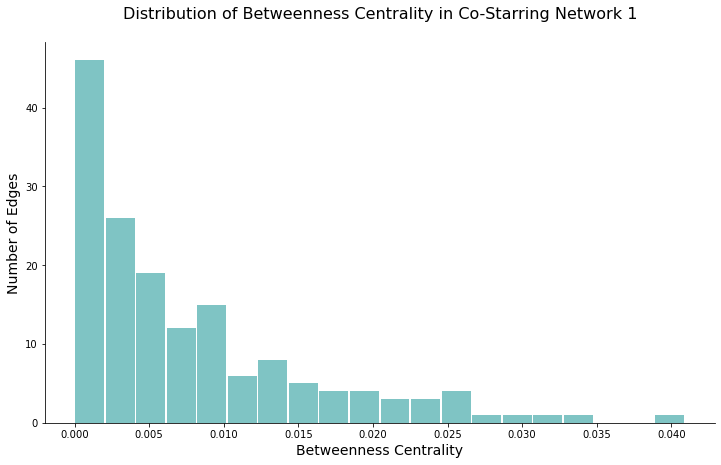

In [74]:
measureStats(g2, nx.betweenness_centrality(g2), "Betweenness Centrality", 3)
histogram(g2, 1, 20, nx.betweenness_centrality(g2), "Betweenness Centrality")

Here we can see a very different distribution to the other centrality measures. Previously we saw that most of our centrality measures were bimodal with a peak at the very low values and a peak around the mean / median. Here, the peak is at the minimum value, 0, and the data is strongly skewed to the right.

The values range from 0 to 0.041. The mean is 0.008, and the median is 0.095

About 63% (45+26+19+12/160) of the betweenness centrality scores are below the mean of 0.008. About 5.6% (4+1+1+1+1+1/160) of the values are about 0.025, with just 1 node with betweenness centrality score above 0.04.

So there are very few nodes in the network that lie on a very large number of shortest paths, acting as brokers in the network.

To visualise this we can once again look at our sociagram and let node size and colour indicate betweenness centrality.

Actor, Betweenness Centrality:
Sigourney Weaver 0.0409
Natalie Portman 0.0332
Woody Harrelson 0.0313


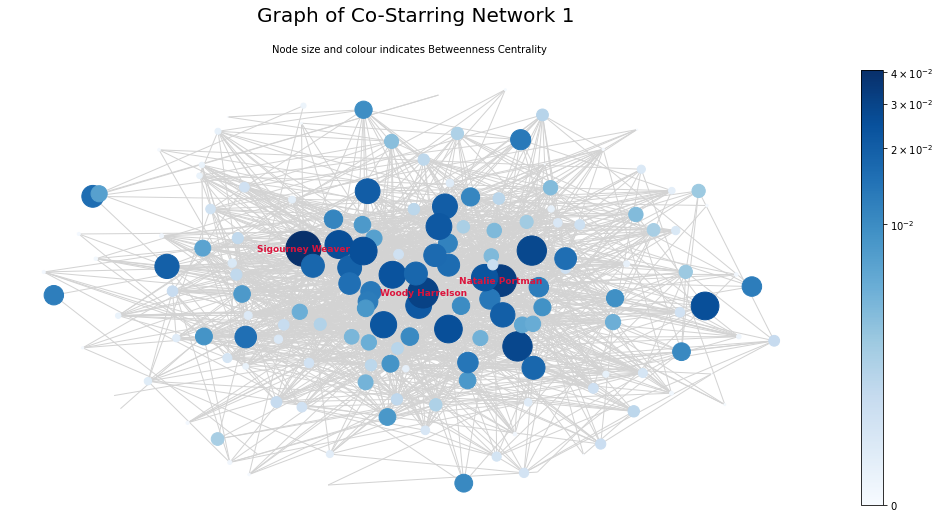

In [75]:
highestBetweenness = actorsWithHighestOfMeasure(g2, nx.betweenness_centrality(g2), 3)

print("Actor, Betweenness Centrality:")
for actor in highestBetweenness.iteritems():
    print(g2.nodes[actor[0]]["name"], round(actor[1], 4))
    

pos = nx.spring_layout(g2, seed=675, k=1.2)
draw(g2, pos, nx.betweenness_centrality(g2), 'Betweenness Centrality', 1, 30000, list(highestBetweenness.index))

As expected, we can see very few nodes with very high betweenness centrality scores, and the majority of the nodes are very tiny indicating small centrality scores. The nodes with the highest betweenness centrality scores are typically very central nodes with a lot of connections as we can see in the diagram. We can also see nodes on the outskirts of the diagram, nodes with few direct connections (low degree) which have a high betweenness centrality score. These nodes are connected to other nodes with very few direct connections, and so removing these nodes may result in isolating some of their connections. Thus, they are important brokers in the network.

Sigourney Weaver has the highest betweenness centrality score of 0.0409, followed by Natalie Portman with 0.0332 and Woody Harrelson with 0.0313. These are all quite central nodes with a lot of connections, which lie on many shortest paths between nodes.

__Closeness Centrality__

The closeness centrality of a node is defined as the reciprocal mean distance from the node to all other reachable nodes in the network. It shows how close the node is to the rest of the graph. This is again a global metric as it does not depend only on the nodes neighbourhood.

It is calculated as 1 / the average of the shortest path length from the node to every other node in the network.

Closeness centrality indicates nodes as more central if they are closer to most of the nodes in the graph. This strongly corresponds to visual centrality — a node that would appear toward the center of a graph when we draw it usually has a high closeness centrality. Closeness can be regarded as a measure of how fast it will take to spread information to all other nodes. If a node has high closeness centrality, it is in a position to spread information quickly. These nodes can be important influencers of the network. It highlights nodes that may reach any other nodes within a few hops and nodes that may be very distant in the graph.

Closeness Centrality Summary Statistics:

Min:  0.259
Max:  0.558 

Mean:  0.464
Median:  0.477


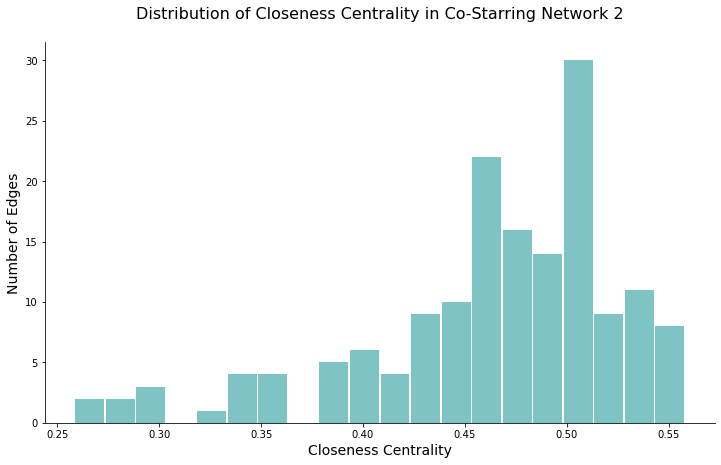

In [76]:
measureStats(g2, nx.closeness_centrality(g2), "Closeness Centrality", 3)
histogram(g2, 2, 20, nx.closeness_centrality(g2), "Closeness Centrality")

Closeness centrality has an approximately normal distribution with a strong skew to the left. The distribution is quite different to the other centrality metrics. For the previous centrality measures we typically saw a distribution entirely skewed to the right, or an approximately normal / bimodal distribution with a right skew. So for most other metrics there were few nodes with very high values. Here however, fewer nodes have very low values. The range of values is from 0.259 to 0.558, with a mean of 0.464.

About 7% of nodes have a closeness centrality score below 0.35. About 24% have a score between 0.35 and 0.45. Approximately 32% have a score between 0.45 and 0.5, leaving 36% with a score above 0.5. Thus a very large number of nodes have a high closeness centrality score, with few nodes having very low scores.

To visualise this we can once again draw our network graph.

Actor, Closeness Centrality:
Susan Sarandon 0.5579
John Lithgow 0.554
Woody Harrelson 0.554


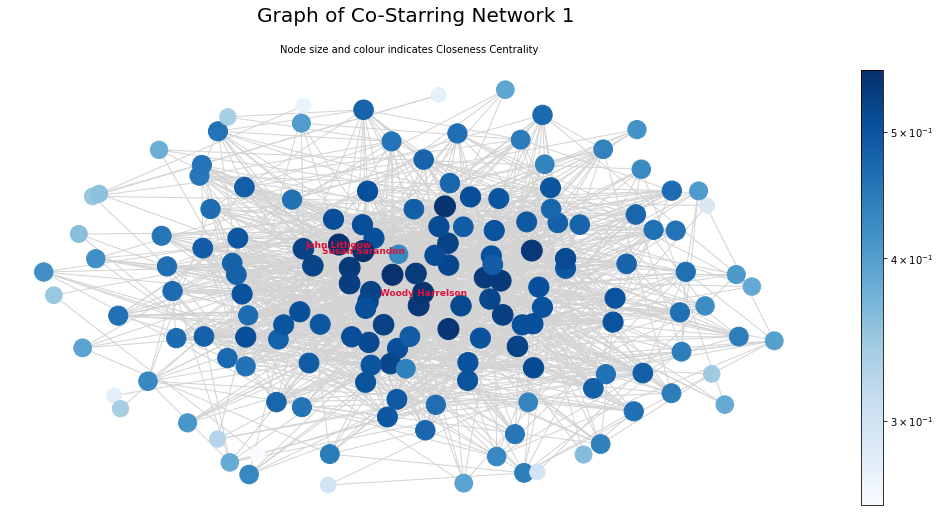

In [77]:
highestCloseness = actorsWithHighestOfMeasure(g2, nx.closeness_centrality(g2), 3)

print("Actor, Closeness Centrality:")
for actor in highestCloseness.iteritems():
    print(g2.nodes[actor[0]]["name"], round(actor[1], 4))
    

pos = nx.spring_layout(g2, seed=675, k=1.2)
draw(g2, pos, nx.closeness_centrality(g2), 'Closeness Centrality', 1, 800, list(highestCloseness.index))

For previous metrics we typically saw a few nodes which were very large, and most other nodes were much smaller. Here however we can see that the majority of nodes are quite large, with a small number of smaller nodes indicating a smaller closeness centrality. This tells us that most of our nodes are a similar short distance to all other nodes, with a small number of nodes which are a larger distance on average to all other nodes. 

We can see that Susan Sarandon, John Lithgow and Woody Harrelson have the highest scores of 0.5579, 0.554 and 0.554. These are the closest to all other nodes on average.

I have now looked at various centrality measures for my second network, in an attempt to identify important and influential nodes in the network.

# <font color='darkcyan'>Task 2 (b)</font>
#### <font color='cadetblue'>Based on the results from the above, discuss how the two networks are different (or similar) to one another</font>

### <font color='darkcyan'>(i) Structure & Connectivity</font>

__Number of nodes and edges and Network Density__

In [78]:
print("Network 1:")
numberEdgesAndWeights(g1)
print("\nNetwork 2:")
numberEdgesAndWeights(g2)

Network 1:
Number of nodes:  147
Number of edges:  1357

Network 2:
Number of nodes:  160
Number of edges:  1543


In both networks we removed 3 isolated nodes in Task 1. This left 147 nodes for Network 1 and 160 nodes for Network 2, so Network 1 has 13 less nodes. Network 1 has 1357 edges. Network 2 has 186 more edges, with 1537 edges. 

__Network Density__

In [79]:
print("Network 1 Density:",round(nx.density(g1)*100, 2), "%")
print("Network 2 Density:",round(nx.density(g2)*100, 2), "%")

Network 1 Density: 12.65 %
Network 2 Density: 12.13 %


We looked at the density of each network, which defines the proportion of potential edges between nodes in a network that exist to actual edges in the network. Network 1 had a density of 12.65%, while Network 2 had a density of 12.13%. Clearly both networks have very similar densities. So although Network 2 has more nodes and edges, the fraction of the number of edges over the number of potential edges, which is determined by the number of nodes, is very similar. Both networks could be said to be quite sparse due to the low network density.

__Connected Components__

In [80]:
print("Network 1 is connected: ", nx.is_connected(g1))
print("Number of connected components: ", nx.number_connected_components(g1))
print("\nNetwork 2 is connected: ", nx.is_connected(g2))
print("Number of connected components: ", nx.number_connected_components(g2))

Network 1 is connected:  True
Number of connected components:  1

Network 2 is connected:  True
Number of connected components:  1


We saw that both networks were fully connected. In other words, a path exists between every pair of nodes in each network.

__Network Diameter__

In [81]:
print("Network 1 Diameter: ", nx.diameter(g1))
print("Network 2 Diameter: ", nx.diameter(g2))

Network 1 Diameter:  5
Network 2 Diameter:  6


Next we looked at the network diameters. A network’s diameter is the maximum distance between all pairs of its nodes - i.e. the longest shortest path in the entire network. 

We saw that network 1 had a diameter of 1 and network 2 had a diameter of 2. The diamater is quite low and very similar for both networks. The diameter tells us how quickly information can be transmitted across the entire network and thus is an important factor in characterising the structure and connectivity of networks. Both networks could be said to be well connected as every node is a maximum of 5 hops from any other node in the network in the case of network 1, and 6 in the case of network 2. 

__Clustering Coefficient__

In [82]:
print("Network 1 Average Clustering Coefficient: ", round(nx.average_clustering(g1), 3))
print("Network 2 Average Clustering Coefficient: ", round(nx.average_clustering(g2), 3))

Network 1 Average Clustering Coefficient:  0.303
Network 2 Average Clustering Coefficient:  0.31


We also looked at the average clustering coefficient, which indicates the level of concentration of edges in the neighbourhood of a node.
It is the fraction of pairs of its neighbours that have edges between one another - i.e. how many closed triads around this node.

We saw once again that the average clustering coefficient for the two networks was very similar, with 0.303 for
Network 1 and 0.31 for Network 2.

So, on average about 1/3 of pairs of a nodes neighbours have edges between them in each of the networks.

#### <font color='darkcyan'>Structure & Connectivity Conclusion</font>

Network 1 and Network 2 have very similar network densities, both within 12-13%. Both networks also have similar diameters, Network 1 with a diameter of 5 and Network 2 a diameter of 6. The average clustering coefficient is also very similar, both having a mean clustering coefficient of about 30%. The two networks are also both fully connected. Thus we can conclude that the networks have very similar structure and connectivity.

### <font color='darkcyan'>(ii) Centrality</font>

__Degree__

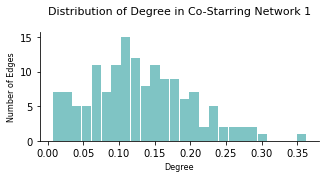

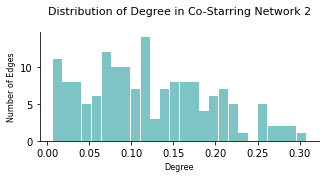

In [83]:
histogram(g1, 1, 26, nx.degree_centrality(g1), "Degree",  5, 2, 11, 8)
histogram(g2, 2, 26, nx.degree_centrality(g2), "Degree",  5, 2, 11, 8)

When discussing the centrality of the two networks we began by looking at the distribution of the node degree centralities. 

The range of degree centrality scores for the two networks was very similar, with 0.7% to 36% for network 1 and 0.6% to 30%. The mean degree centrality scores were 13% for network 1 and 12% for network 2, and the medians were 12% and 11% for network 1 and network 2 respectiely.

The distribution for network 1 had a strong skew to the right, with the greatest concentration of degree values around the mean and median. 16% of nodes had a degree below about 6.5%. 66% had a score between 5% and 20%, with 30% between 10% and 15%. 17% had a score above 20%. 


The distribution for network 2 was approximately bimodal, with a peak at around 0.006 and 0.12. The largest number of nodes have a degree within about 5% of the average. A considerable amount have a very low degree, and less have a very high degree, however there are still quite a few nodes with a high degree in comparison to network 1.

20% of nodes had a score below about 5%. 23% had a score between 5% and 10%. About 48% had a score between 10% and 25%, leaving 8% with a degree centrality score above 25%. 


Network 1 seems to have a larger fraction of nodes with very low degree centrality scores, and a very large fraction of degrees concentrated around the mean, with very few nodes having high degree values. Network 2 seems to have flatter peaks with a much larger fraction of nodes having high degrees. Although the highest degree reached is slightly less than network 1, the fraction of nodes with high degrees is larger.  

So, network 2 seems to have a slightly larger proportion of nodes with a lot of edges, and less nodes with very few edges than network 1. However, the minimum and maximum degree centrality scores, as well as the mean and median are very similar for both networks.

__Weighted Degree__

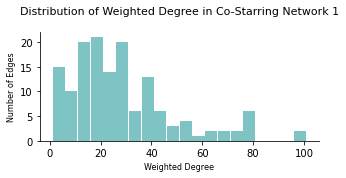

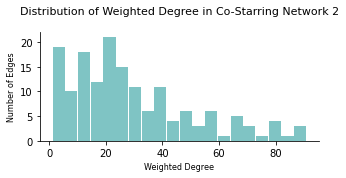

In [84]:
histogram(g1, 1, 20, nx.get_node_attributes(g1, "weightedDegree"), "Weighted Degree", 5, 2, 11, 8)
histogram(g2, 2, 20, nx.get_node_attributes(g2, "weightedDegree"), "Weighted Degree", 5, 2, 11, 8)

Next we will compare the distribution of the weighted degrees. The weighted degree of a node is the sum of the weights on the edges connected to that node.

Both networks had a minimum weighted degree of 1. Network 1 had a maximum weighted degree of 101, while the maximum weighted degree for network 2 was 91, 10 lower than that of network 1.

Network 1 had a mean weighted degree of 28, while network 2 had a mean weighted degree of 29. Network 1 had a median weighted degree of 23, and network 2 had a median weighted degree of 24. So the mean and median weighted degrees for the two networks are very similar, with the mean and median being 1 larger for network 2 than those of network 1.

The shape of the distributions of weighted degree for the two networks was very similar, as seen by the histograms above. Both had the largest concentration of values from about 0-40. Network 1 had 80% of the values between 0 and 40, while Network 2 had about 77% of the values within this range. For network 1 there were just two nodes with weighted degree above 80, with values 98 and 101. Similarly for network 2 there are only 3 nodes with values over 80, with values 91, 88 and 88.

Thus, we can conclude that the distribution of weighted degrees for the two networks is very similar.

__Eigenvector Centrality__

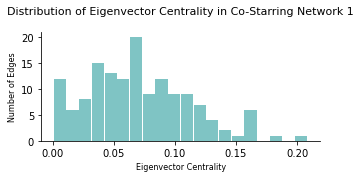

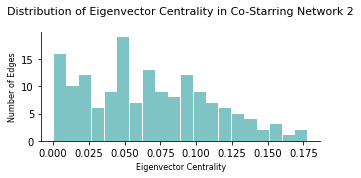

In [85]:
histogram(g1, 1, 20, nx.eigenvector_centrality(g1), "Eigenvector Centrality", 5, 2, 11, 8)
histogram(g2, 2, 20, nx.eigenvector_centrality(g2), "Eigenvector Centrality", 5, 2, 11, 8)

Next we can compare the eigenvector centrality distribution, which defines centrality of a node as proportional to its neighbors’ importance. For eigenvector centrality, relative scores are assigned to all nodes in the network based on the concept that connections to high-scoring nodes contribute more to the score of the node in question than equal connections to low-scoring nodes.

The maximum value for eigenvector centrality for network 1 was 0.209 and for network 2 was 0.178. Both had a minimum of 0. The mean for network 1 was 0.071, and for network 2 was 0.066. The median was 0.067 for network 1 and 0.063 for network 2. So, the max, mean and median was slightly larger for network 1, however, the values are very similar.

From the histograms above we can see that there is a slightly greater concentration of values around the lower eigenvector centrality values of about 0-0.05 for network 2 than for network 1. For both networks the distribution is approximately bimodal, both having a peak at 0, followed by a peak at around 0.06-0.07 for network 1, and a peak at about 0.04-0.05 for network 2. Both are strongly skewed to the right.

About 6% of the values are above 0.15 for network 1, with only 3.7% for network 2. While the highest value reached for network 2 was 0.178, network 1 only has one node above this. with one node having 0.209.


Overall the distributions are very similar. Network 1 seems to have a slightly larger proportion of nodes with high eigenvector centrality scores than network 2. These are important nodes in the network which are connected to other important nodes.

Network 2 has a larger proportion of nodes with lower eigenvector centrality scores, nodes whos neighbour are not very important.

__Betweenness Centrality__

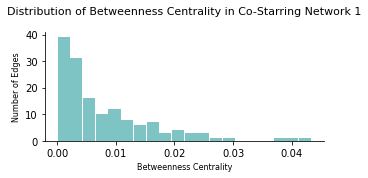

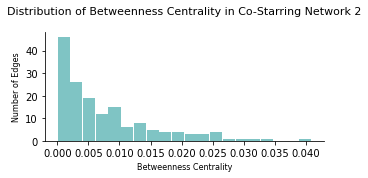

In [86]:
histogram(g1, 1, 20, nx.betweenness_centrality(g1), "Betweenness Centrality", 5, 2, 11, 8)
histogram(g2, 2, 20, nx.betweenness_centrality(g2), "Betweenness Centrality", 5, 2, 11, 8)

We can also compare the distribution of the betweenness centralities for the two networks. Betweenness centrality identifies strategic linkages, “brokers” or “bridging nodes” in a network. Nodes that occur on many shortest paths between other nodes in the network have a high betweenness centrality score.

Here we can immediately see a very different distribution to the other centrality measures, although the distribution is very similar for both networks. For each network the minimum betweenness centrality score was 0, and the maximum was 0.043 for network 1 and 0.041 for network 2. The mean and median were the same for both networks, with a mean of 0.008 and median of 0.005.

For both networks there is a peak at 0 followed by a sharp drop and skew to the right. For network 1 60% of the values are below the mean, while for network 2 63% are. For network 1 there are 2 nodes with betweenness centrality above 1, while for network 2 there is just 1.

Thus, the distribution of nodes that act as brokers in the network is very similar for the two networks, with extremely similar betweenness centrality distributions.

__Closeness Centrality__

Finally, we can compare the closeness centrality distributions. The closeness centrality of a node is defined as the reciprocal mean distance from the node to all other reachable nodes in the network. It shows how close the node is to the rest of the graph. 

It is calculated as 1 / the average of the shortest path length from the node to every other node in the network.

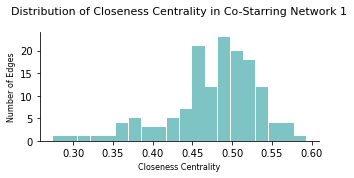

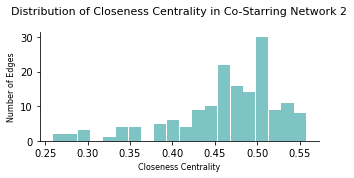

In [87]:
histogram(g1, 1, 20, nx.closeness_centrality(g1), "Closeness Centrality", 5, 2, 11, 8)
histogram(g2, 2, 20, nx.closeness_centrality(g2), "Closeness Centrality", 5, 2, 11, 8)

The range of values for closeness centrality was 0.27-0.59 for network 1 and 0.26 - 0.56 for network 2. The means were 0.48 and 0.46, and medians were 0.49 and 0.47. 

For both networks we saw an approximately normal distribution with a strong skew to the left. For each, there were a small number of nodes with very low values for closeness centrality, the majority of values were concentratd around the mean, with a small number of nodes with very high values.

For network 1, about 11% of nodes had a score below 0.4. About 64% had a score between 0.45 and 0.55, and around 6% had a score above this.

For network 2, about 7% of nodes had a score below 0.35. About 24% had a score between 0.35 and 0.45. Approximately 32% had a score between 0.45 and 0.5, leaving 36% with a score above 0.5. 

Thus, the distributions for closeness centrality for both networks were very similar, with similar shapes in distribution, mean, median and range.

#### <font color='darkcyan'>Centrality Conclusion</font>

Overall the centrality of the two networks is very similar. For each of the centrality measures we saw very similar means, medians and minimum and maximum values for each of the networks. The shape of the distributions were also very similar. 

Due to this we can conclude that there is a very strong similarity between the structure, connectivity and centrality of the two co-starring networks.

## <font color='darkcyan'>Task 3: Ego-centric analysis</font>

For each of the networks created in Task 1:


• Select one of the important nodes in the network as identified in Task 2


• Generate an ego network for this node and characterise the structure of the new smaller network.


One way of examining a network at a smaller scale is to take an ego-centric approach. By collecting information on the connections among nodes connected to a single node of interest, we can build a picture of the local structure around that node.

Ego-centric networks are a particular type of network which specifically maps the connections of and from the perspective of a single person (an “ego”), i.e. a subgraph which consists of a focal node (the ego) and the nodes to whom ego is directly connected (the alters), plus the edges among the alters.

__Choosing an important node:__

To select an important node to generate an ego network for, I will rank all of the nodes based on the various centrality measures, and chose the node with the highest rank. I will rank based on degree centrality, weighted degree, betweenness centrality, eigenvector centrality and closeness centrality. 

For each centrality measure, the nodes will be assigned a score from the value of the number of nodes (node with highest score) to 1 (node with lowest score). The scores for each will be summed, to get the node with the highest ranking overall.

In [88]:
def mostInfluential(g):
    
    CentralityMeasures = {"weightedDegree" : nx.get_node_attributes(g, "weightedDegree"),
                          "degreeCentrality" : nx.degree_centrality(g),
                          "betweennessCentrality" : nx.betweenness_centrality(g), 
                          "eigenvectorCentrality" : nx.eigenvector_centrality(g),
                          "closenessCentrality" : nx.closeness_centrality(g)
                  }

    rank = {}
    
    # for each centrality measure
    for measure_name in CentralityMeasures:

        measure = CentralityMeasures[measure_name]
        
            # construct a dataframe of node id, measure scores for the given measure
            # sort in descending order (highest rank -> lowest rank)
        m = pd.DataFrame.from_dict(dict(measure), orient='index', columns=[measure_name]).sort_values(by = measure_name, ascending=False)
    
        # ranking will start at the value of the number of nodes
        # highest ranked node for the current measure will recieve a rank of number of nodes
        i=g.number_of_nodes()
        
        # for each node
        for element in m.head(g.number_of_nodes()).index:
            
            # add ranking for the current measure to the ranking in the rank dictionary for the current node
            if element in rank.keys():
                rank[element]= rank[element] + i
                
            # for the first measure, add nodes and rankings for first measure to rank dictionary
            else:
                rank[element]= i
                
            # decrememnt the rank for the next node
            i -= 1

    # highest ranked actor is the actor with the highest key value in rank dictionary
    highestRankedActor = max(rank.keys(), key=(lambda key: rank[key]))
    print("Highest Ranked Actor:")
    print("\t", highestRankedActor, g.nodes[highestRankedActor]["name"], "\n")

    # sort the rank by keys and get the first 10, print top 10 ranking
    top10Actors = sorted(rank.keys(), key=(lambda key: rank[key]), reverse=True)[:10]

    print("Actor Centrality Ranking Top 10:\n")
    for actor in top10Actors:
        print("\t",actor, g.nodes[actor]["name"])
    
    # return the highest ranked actor
    return highestRankedActor 

## <font color='cadetblue'>Task 3 Network 1:</font>

I will begin by constructing and analysing the structure of the ego network for Network 1. First I will identify the important node to construct the ego network from using the above method.

In [89]:
highestRankedg1=mostInfluential(g1)

Highest Ranked Actor:
	 0000553 Liam Neeson 

Actor Centrality Ranking Top 10:

	 0000553 Liam Neeson
	 0000134 Robert De Niro
	 0002091 Michael Gambon
	 0000353 Willem Dafoe
	 0000545 Helen Mirren
	 0000194 Julianne Moore
	 0000701 Kate Winslet
	 0000228 Kevin Spacey
	 0004851 Penélope Cruz
	 0785227 Andy Serkis


Liam Neeson is the highest ranked actor. Recall that when applying the centrality measures to network 1 in task 2, Liam Neeson had the highest degree centrality, eigenvector centrality, betweenness centrality and closeness centrality, so he is very clearly an important node in the netowork. 

We can construct an ego network for this node as follows:

In [90]:
# highestRankedg1 is the id of the highest ranked node returned from the mostInfluential method. 
# In this case the id of liam neeson

ego1 = nx.ego_graph(g1, highestRankedg1)

Now that we have constructed the ego network, we can look at the structure of the netowrk, starting with the number of nodes and edges.

In [91]:
print("Ego Network 1:")
numberEdgesAndWeights(ego1)

Ego Network 1:
Number of nodes:  54
Number of edges:  357


The network has 54 nodes (1 focal node and 53 alter nodes) and 357 edges (53 edges from the alters to the focal nodes - all nodes in the ego network are connected to the ego,  and 304 edges between alters).

We can draw our graph to visualise this. We will start with a simple diagram where all nodes and edges are the same size and colour, and we will label the ego node:

In [92]:
def drawEgo(G, pos, num, node_list=[], font=9, width=18, height=8):
    
    plt.figure(3, figsize=(width,height)) 
    
    nx.draw_networkx(G,
                     pos,
                     edge_color="lightgray", 
                     node_size=400, 
                     with_labels=False, 
                     node_color="lightseagreen")

    # add labels, if any (node_list is a list of nodes to be labelled, default is empty list)
    if not node_list==[]:
        labels = {}    
        for node in G.nodes():
            if node in node_list:
                labels[node] = G.nodes[node]["name"]
                
        labelNodes = nx.draw_networkx_labels(G,
                                             pos,
                                             labels,
                                             font_size=font,
                                             font_color='darkslategrey', 
                                             font_weight="bold")
        
    plt.axis('off')
            
    # add title

    label = "Graph of Co-Starring Ego Network " + str(num)
    plt.title(label = label, fontsize = 14)

    plt.show()

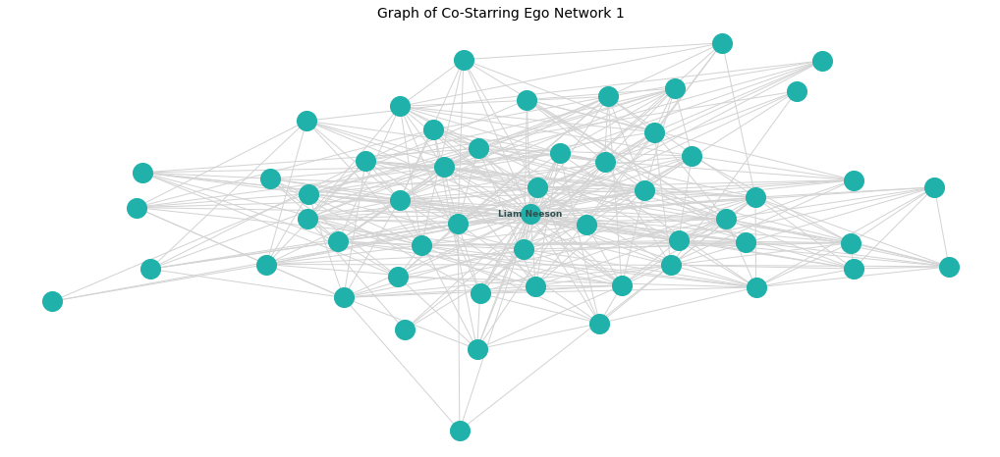

In [93]:
pos = nx.spring_layout(ego1, seed=675, k=1)
drawEgo(ego1, pos, 1, [highestRankedg1])

__Network Density__

To characterise the nextwork structure we can look at the network density. Network density refers to the portion of potential edges between nodes in a network that exist as actual edges. A network with high density is said to be dense, while a network with low density is said to be sparse.

Density is calculated numerically as the ratio of existing edges over the total number of potential edges between all pairs of nodes.

In [94]:
print("Density of Ego Network 1:\n")
networkDensity(ego1)

Density of Ego Network 1:

Number of potential edges:  1431
Number of actual edges:  357
Network Density:  24.95 %



The density of the ego network is 24.95%. About 1/4 of the potential edges are actual edges, so the network is relatively sparse.

We know by the definiton of an ego network that it must be connected, as all nodes are connected to the focal node, so at least 1 path exists between every pair of nodes (through the focal nodes). We can check this:

In [95]:
print("Number of connected components: ", nx.number_connected_components(ego1))
print("Ego Network 1 is connected: ", nx.is_connected(ego1))

Number of connected components:  1
Ego Network 1 is connected:  True


As expected, our ego network is connected.

__Network Diameter__

Next we can look at the diameter of the ego network. A network’s diameter is the maximum distance between all pairs of its nodes - i.e. the longest shortest path in the entire network. The diameter tells us how quickly information can be transmitted across the entire network. The higher the diameter, the less linked a network tends to be.

The diameter of the network will be infinite if the network is not fully connected. We know from above that our network is connected.

We can calculate the diameter as follows:

In [96]:
print("Ego Network 1 Diameter: ", nx.diameter(ego1))

Ego Network 1 Diameter:  2


We can see that ego network 1 has a diameter of 2. This means that the longest distance between any two nodes in the network, taking the shortest path possible, is 2, i.e. max of 2 edges must be crossed to get from one node to any other in the network.

This is expected again due to the definition of the ego network. Each node is connected to the ego node, so for any two nodes a path exists from the first node to the ego node, and then from the ego node to the second node => distance of 2. For nodes which are directly connected, the distance is 1.

__Clustering Coefficient__

Clustering coefficient indicates the level of concentration of edges in the neighbourhood of a node.
It is the fraction of pairs of its neighbours that have edges between one another - i.e. how many closed triads around this node.

(Closed triad = if a node A is connected to nodes B and C, and B and C are also connected, then A, B and C form a closed triad.)

We can calculate the average clustering coefficient of all of the nodes in the ego network:

In [97]:
print("Average Clustering Coefficient: ", round(nx.average_clustering(ego1), 3))

Average Clustering Coefficient:  0.483


On average, almost 1/2 of the pairs of neighbours of a node are connected.

__Degree Distribution__

Next we can look at the distribution of the degrees in the ego network. The degree of a node is equal to the number of edges the node is connected to, i.e. the number of direct connections. In this network each node can have a maximum of 53 connections (directly connected to every other node)

We can look at the distribution of the degrees which tells the number of edges, as well as the degree centrality which tells us the percentage of edges relative to the total number of nodes.

Degree Summary Statistics:

Min:  3
Max:  53 

Mean:  13.0
Median:  13.0


Degree Centrality Summary Statistics:

Min:  0.06
Max:  1.0 

Mean:  0.25
Median:  0.25


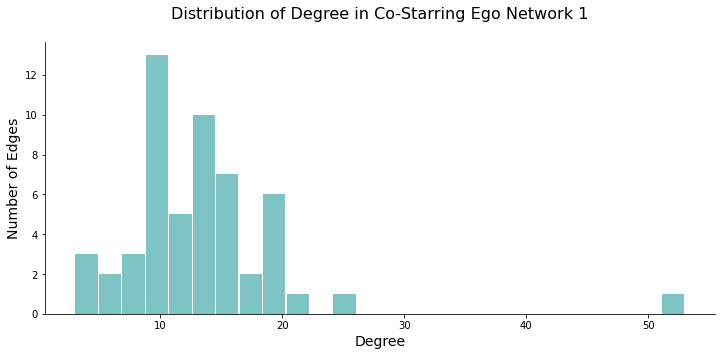

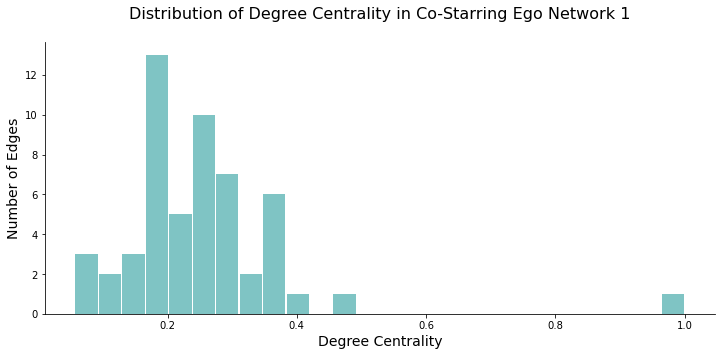

In [98]:
measureStats(ego1, dict(ego1.degree()), "Degree")
print("\n")
measureStats(ego1, nx.degree_centrality(ego1), "Degree Centrality", r=2)
histogram(ego1, 1, 26, dict(ego1.degree()), "Degree", height=5, ego=True)
histogram(ego1, 1, 26, nx.degree_centrality(ego1), "Degree Centrality", height=5, ego=True)

The degrees range from 1 to 53. We know that no node can have a degree less than 1 as our network is connected. There is 1 node with the maximum degree of 53. We know that this is the ego node, as by definition the ego node is connected to all other nodes in the network. We can see from the histogram that there are very few nodes with only a few connections. There are around 8 nodes with degree below 9, ie degree centrality below about 15%. This leaves 85% of nodes with a degree of or above 9 (1-8/54), i.e. 85% of nodes in the network are connected to at least 9 other nodes (degree above 15%). The highest peak can be seen at around degree 9-10, containing 13 nodes. These nodes are connected to just under 20% of other nodes in the network. The highest degree for any alter node is around 25, or a degree centrality of just under 50%. About 17 nodes (31%) have between 15 and 25 edges, ie degree centrality between about 30% and 50%. We can see an approximately normal distribution of the degrees for the alters. 

The average degree centrality is 0.25, i.e. on average each node has 13 edges, or is connected to 25% of other nodes.

We can draw our network to further visualise this.

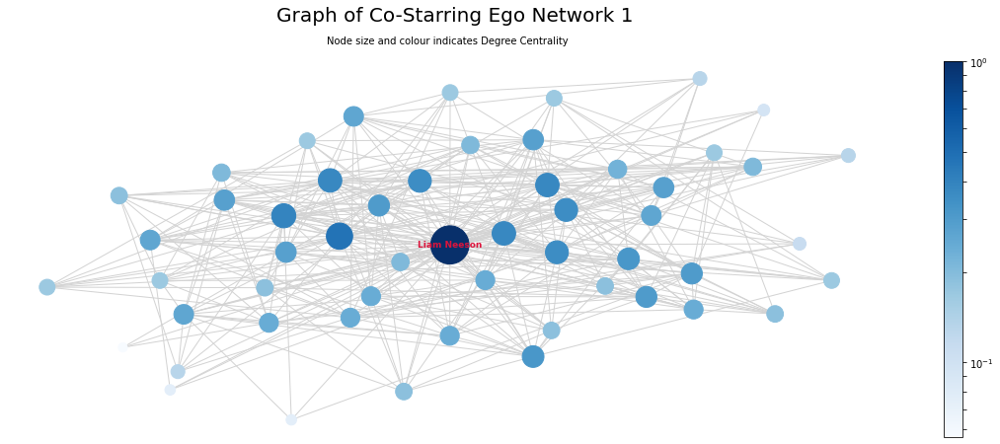

In [99]:
pos = nx.spring_layout(ego1, seed=675, k=1.5)
draw(ego1, pos, nx.degree_centrality(ego1), 'Degree Centrality', 1, 1500, [highestRankedg1], 9, 20, 7, ego=True)

As expected, the ego node has a significantly larger node size and darker node colour than the other nodes indicating a higher degree centrality score.

__Weighted Degree__

Recall that each edge in our network has a weight, which for each edge is the number of movies the two nodes which the edge connects have acted together in. The weighted degree of a node is the sum of the weights on the edges connected to that node. The weightedDegree for each node will currently be the same as it was in the original network, as weightedNegree is a node attribute. We can recalculate the weightedDegrees only taking into account the edges in the ego network using the same method we used to add the weighted degrees for the original network:

In [100]:
weightedDegree(ego1)
print("Weighted Degrees: ")
print(nx.get_node_attributes(ego1, "weightedDegree"))

Weighted Degrees: 
{'0000134': 37, '3485845': 29, '0785227': 35, '0000434': 27, '0004695': 15, '0571952': 5, '0000148': 37, '0318821': 13, '0004266': 11, '2257207': 9, '1727304': 34, '0000667': 26, '0001337': 8, '0001448': 10, '0000164': 22, '0000120': 16, '0842770': 19, '0000702': 15, '0000668': 24, '0000138': 16, '0000235': 11, '0000545': 30, '0000194': 32, '0000107': 8, '0000368': 21, '0001845': 17, '0614165': 16, '0274913': 10, '0358316': 18, '4511652': 14, '0001324': 12, '0000321': 17, '0268199': 18, '0000380': 17, '0136797': 22, '0000191': 27, '0000614': 27, '0001691': 7, '1706767': 17, '0182839': 22, '0000059': 6, '0205626': 10, '0001570': 29, '0006969': 14, '0165101': 21, '0004851': 22, '0000142': 6, '0000473': 12, '1208167': 4, '0000531': 16, '0748973': 21, '5397459': 24, '0000553': 76, '0000228': 26}


Now that we have added the new weighted degree attributes we can look at the distribution.

Weighted Degree Summary Statistics:

Min:  4
Max:  76 

Mean:  20.0
Median:  17.0


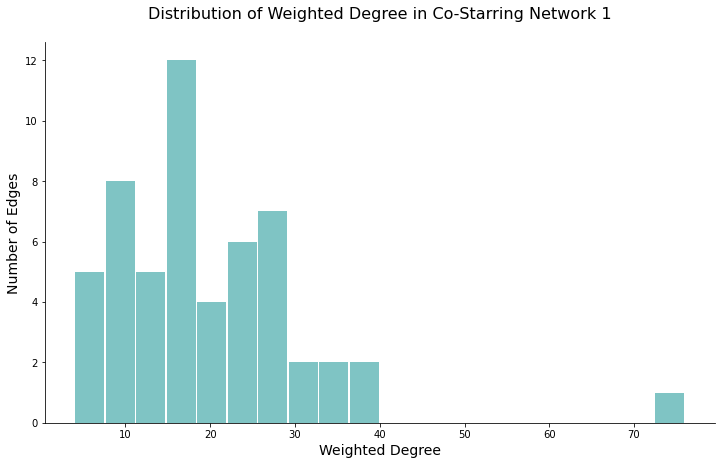

In [101]:
measureStats(ego1, nx.get_node_attributes(ego1, "weightedDegree"), "Weighted Degree")
histogram(ego1, 1, 20, nx.get_node_attributes(ego1, "weightedDegree"), "Weighted Degree", height=7)

The range of weighted degrees is from 4 to 76. We can see that only 1 node has a weighted degree above 40. We know that this node must be the ego node, as the minimum weighted degree for the ego node is 53 (ego has 53 connections, this would be in the case that every edge connected to the ego has a weight of 1). 

So, the range for the alter's weighted degrees is between 4 and about 40. 11 nodes (20%) have a weighted degree below 11. There is a peak between weighted degrees 15-18 with a count of 12 (22% of nodes). 30% of nodes have weighted degree below this, leaving 43% with weighted degree between 18-40.

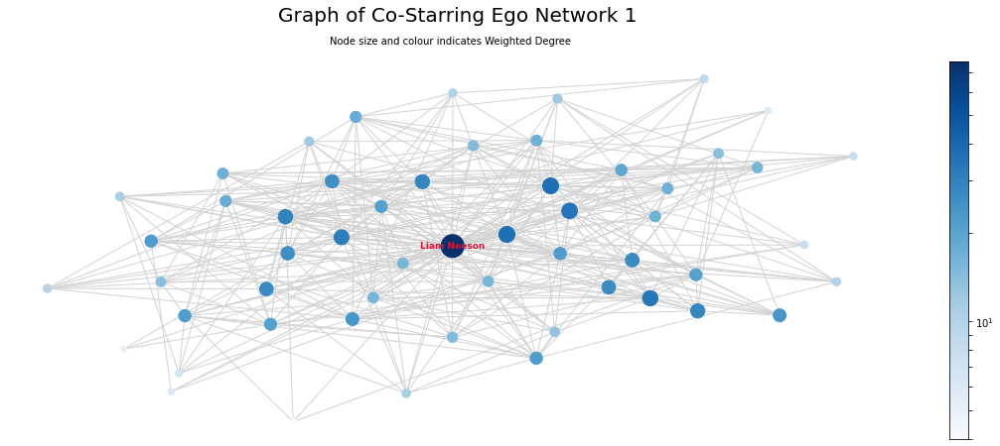

In [102]:
pos = nx.spring_layout(ego1, seed=675, k=1.5)
draw(ego1, pos, nx.get_node_attributes(ego1, "weightedDegree"), 'Weighted Degree', 1, 7, [highestRankedg1], 9, 20, 7, ego=True)

As expected, once again the ego node has a significantly larger node size and darker node colour than the other nodes indicating a higher weighted degree.

__Eigenvector Centrality__

Eigenvector centrality is a basic extension of degree centrality, which defines centrality of a 
node as proportional to its neighbors’ importance. When we sum up all connections of a node, not all 
neighbors are equally important. For eigenvector centrality, relative scores are assigned to all nodes in the network based on the concept that connections to high-scoring nodes contribute more to the score of the node in question than equal connections to low-scoring nodes.

Eigenvector Centrality Summary Statistics:

Min:  0.036
Max:  0.388 

Mean:  0.125
Median:  0.116


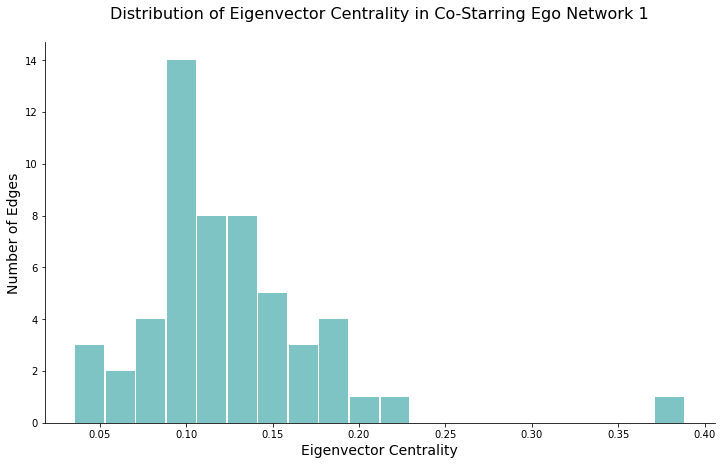

In [103]:
measureStats(ego1, nx.eigenvector_centrality(ego1), "Eigenvector Centrality", 3)
histogram(ego1, 1, 20, nx.eigenvector_centrality(ego1), "Eigenvector Centrality", ego=True)

For eigenvector centrality we can see an approximately normal distribution with an outlier at around 0.37. It is likely that this outlier is the eigenvector centrality of the ego but we can check this:

In [104]:
print("Actor with highest eigenvector centrality score: ")
print(ego1.nodes[list(actorsWithHighestOfMeasure(ego1, nx.eigenvector_centrality(ego1), 1).index)[0]]["name"])

Actor with highest eigenvector centrality score: 
Liam Neeson


The ego node has an eigenvector centrality score of 0.388.

The eigenvector centrality scores for the alter range from 0.036 to about 0.23. The distribution looks approximately normal with a slight skew to the right. There is a peak around 0.09-0.1 with a count of 14 (25% of nodes). 16% have an eigenvector centrality score below this. 55% have an eigenvector centrality score above this and below 0.23.

We can once again draw our ego network and let node size and colour indicate eigenvector centrality.

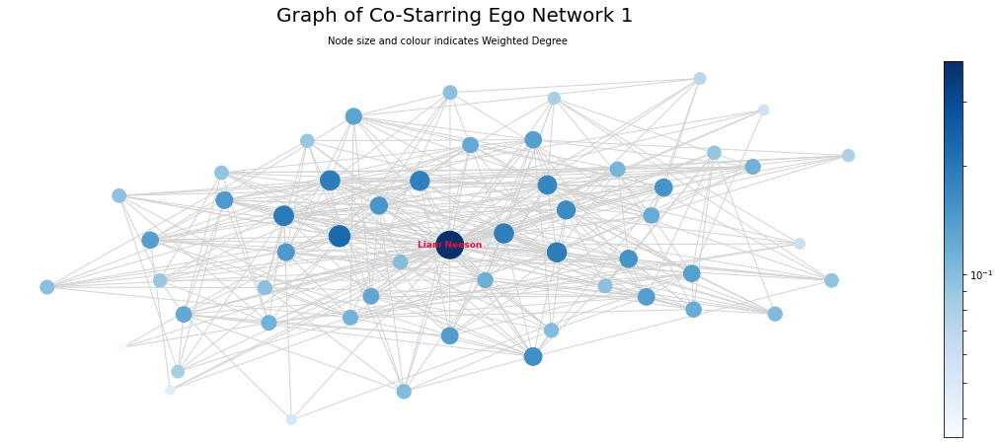

In [105]:
pos = nx.spring_layout(ego1, seed=675, k=1.5)
draw(ego1, pos, nx.eigenvector_centrality(ego1), 'Weighted Degree', 1, 2000, [highestRankedg1], 9, 20, 7, ego=True)

__Betweenness Centrality__

As mentioned in task 2, the previous centrality measures do not capture the idea of brokerage. Betweenness centrality identifies strategic linkages, “brokers” or “bridging nodes” in a network.

Nodes that occur on many shortest paths between other nodes in the network have a high betweenness centrality score.

Betweenness Centrality Summary Statistics:

Min:  0.0
Max:  0.329 

Mean:  0.014
Median:  0.007


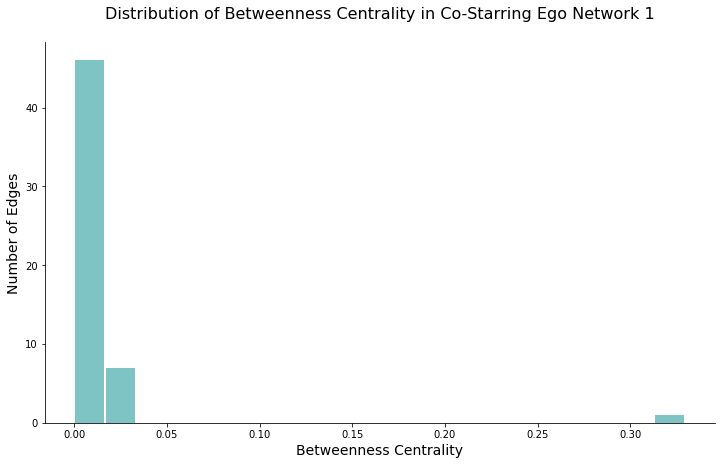

In [106]:
measureStats(ego1, nx.betweenness_centrality(ego1), "Betweenness Centrality", 3)
histogram(ego1, 1, 20, nx.betweenness_centrality(ego1), "Betweenness Centrality", ego=True)

Here we can see that 1 node has a very high betweenness centrality score of above 0.3, while the rest have scores below 0.05. Because of this it is very difficult to see the distribution of the other nodes' values.

It is very likely that the node with the very high betweenness centrality score is the ego node, but we can check this:

In [107]:
print("Actor with highest betweenness centrality score: ")
print(ego1.nodes[list(actorsWithHighestOfMeasure(ego1, nx.betweenness_centrality(ego1), 1).index)[0]]["name"])
print("Score: ", round(nx.betweenness_centrality(ego1)[highestRankedg1], 3))

Actor with highest betweenness centrality score: 
Liam Neeson
Score:  0.329


As expected, the ego node has the highest betweenness centrality score, with a score of 0.329. This is unsurprising as for every pair of nodes in the ego network that are not directly connected, the shortest path between them will be from the first node to the ego node and then to the second node.

To more clearly see the distribution of the alters' betweenness centrality scores we can plot the histogram again without the ego node's score.

In [108]:
def histogram_removeEgo(g, num, bins, measure, measure_name, ego=False):
    
    # sort measure values in ascending order
    data = sorted(list(measure.values()))
    
    # remove the last value (the highest)
    data = data[:len(data)-1]
    
    # print summary stats
    stats=pd.Series(data)
    print(measure_name, "Summary Statistics:\n")
    print("Min:", round(stats.min(), 3), "\nMax: ", round(stats.max(), 3), "\nMean: ", round(stats.mean(), 3))

    plt.figure(figsize=(12, 7))

    # plot histogram
    plt.hist(data, 
             color="darkcyan", 
             bins=bins, # number of bins
             alpha=0.5, # opacity
             rwidth=0.95) # bar width
    
    # labels
    if ego:
        label = "Distribution of " + measure_name + " in Co-Starring Ego Network " + str(num) + "\n"
    else:
        label = "Distribution of " + measure_name + " in Co-Starring Network " + str(num) + "\n"
    plt.title(label, fontsize=16)
    
    plt.ylabel("Number of Edges", fontsize=14)
    plt.xlabel(measure_name, fontsize=14)
    
    mpl.rcParams['axes.spines.right'] = False
    mpl.rcParams['axes.spines.top'] = False
    
    plt.show()

Betweenness Centrality Summary Statistics:

Min: 0.0 
Max:  0.033 
Mean:  0.008


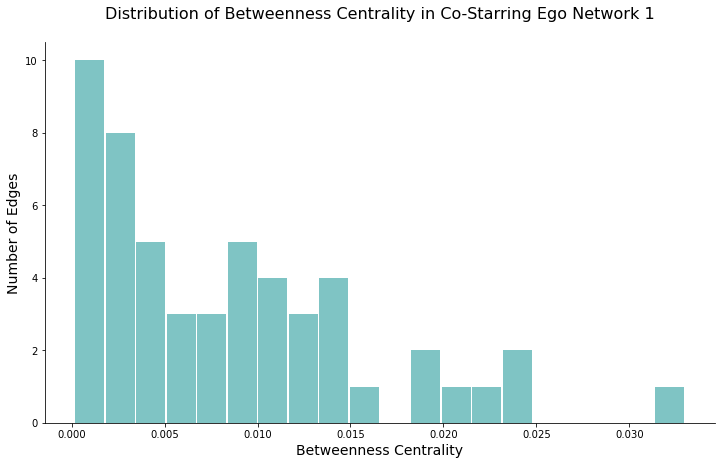

In [109]:
histogram_removeEgo(ego1, 1, 20, nx.betweenness_centrality(ego1), "Betweenness Centrality", ego=True)

Now it is much easier to see the distribution of the betweenness centrality scores of the alters. The range of betweenness centrality scores is 0 - 0.033. There is a peak at about 0-0.001 with a count of 10 (18%), followed by a skew to the right. 85% of alter nodes have a betweenness centrality score below 0.015. There is one node with a score above 0.03. 

__Closeness Centrality__

Closeness Centrality measures the extent to which a node is close to all other nodes in a network. It is calculated as the inverse of the mean distance to all other nodes.

Closeness Centrality Summary Statistics:

Min:  0.515
Max:  1.0 

Mean:  0.576
Median:  0.57


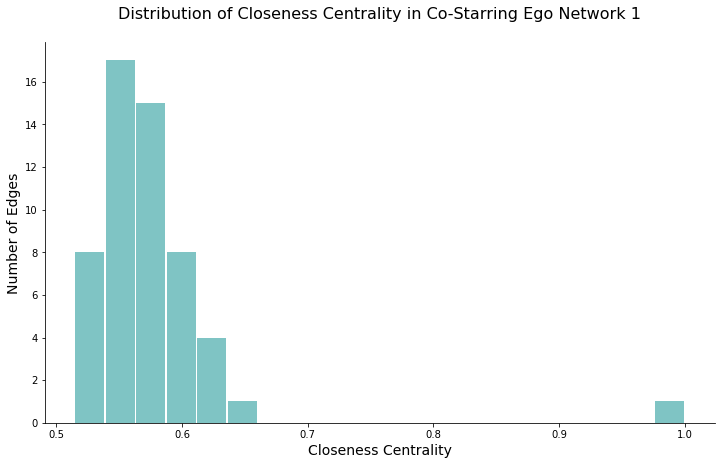

In [110]:
measureStats(ego1, nx.closeness_centrality(ego1), "Closeness Centrality", 3)
histogram(ego1, 1, 20, nx.closeness_centrality(ego1), "Closeness Centrality", ego=True)

Unsurprisingly, we can see that one node has a closeness centrality score of 1. This is the ego node, as it is a distance of 1 from each node by definition, therefore a mean distance of 1, and the inverse of this is 1.

Because the maximum distance between any two nodes in the ego network is 2 (through the ego node), the closeness centrality of a node will depend on the number of direct connections the node has (the degree).

8 nodes have a closeness centrality of around 0.52-0.54, i.e. a mean distance of 1.85-1.9 from every other node.32 nodes (about 60%) have a closeness centrality of about 0.54-0.58, i.e. a mean distance of 1.72-1.85. A further 26% have a closeness centrality score above this, with just the ego having a score above 0.66.

__Conclusion__

I have now analysed the structure anc connectivity of my ego network by looking at the number of nodes and edges, the density, the diameter and the average clustering coefficient. I then looked at the distribution of various centrality measures, such as degree, eigenvector centrality, betweenness centrality and closeness centrality. For each of these measures we could see that the distribution for the alters was quite similar to that of the distribution for the original full network, and the ego node typically had a significantly higher score than the rest for each measure. This completes my analysis of the first ego network.

## <font color='cadetblue'>Task 3 Network 2:</font>

Next I will construct and analyse the structure of the ego network for Network 2. Once again I will begin by identifing an important node to construct the ego network from using the same method as with Network 1.

In [111]:
highestRankedg2=mostInfluential(g2)

Highest Ranked Actor:
	 0000658 Meryl Streep 

Actor Centrality Ranking Top 10:

	 0000658 Meryl Streep
	 0000146 Ralph Fiennes
	 0000215 Susan Sarandon
	 0000437 Woody Harrelson
	 0001475 John Lithgow
	 0322407 Brendan Gleeson
	 0000980 Jim Broadbent
	 0000204 Natalie Portman
	 0000379 Kirsten Dunst
	 0001426 Ben Kingsley


Meryl Streep is the highest ranked actor. Recall that when applying the centrality measures to network 2 in task 2, Meryl Streep had the highest degree centrality and eigenvector centrality so she is very clearly an important node in the netowork. 

We can construct an ego network for this node as follows:

In [112]:
ego2 = nx.ego_graph(g2, highestRankedg2)

Now that we have constructed the ego network, we can look at the structure of the network, starting with the number of nodes and edges.

In [113]:
print("Ego Netowkr 2:")
numberEdgesAndWeights(ego2)

Ego Netowkr 2:
Number of nodes:  50
Number of edges:  348


The network has 50 nodes (1 focal nodes and 49 alter nodes) and 348 edges (49 edges from the alters to the focal nodes - all nodes in the ego network are connected to the ego,  and 299 edges between the alters).
We can once again draw our graph to visualise this.

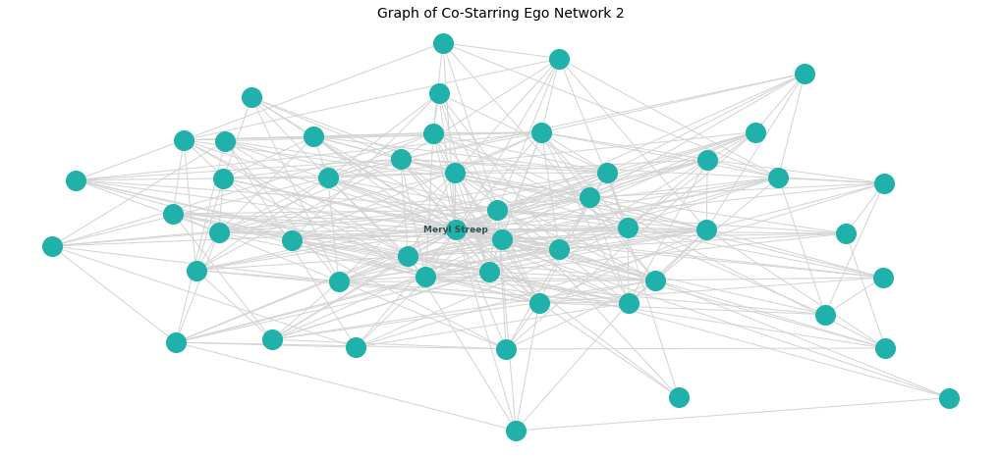

In [114]:
pos = nx.spring_layout(ego2, seed=675, k=1)
drawEgo(ego2, pos, 2, [highestRankedg2])

__Network Density__

To characterise the nextwork structure we can look at the network density. Network density refers to the portion of potential edges between nodes in a network that exist as actual edges. A network with high density is said to be dense, while a network with low density is said to be sparse.

Density is calculated numerically as the ratio of existing edges over the total number of potential edges between all pairs of nodes.

In [115]:
print("Density of Ego Network 2:\n")
networkDensity(ego2)

Density of Ego Network 2:

Number of potential edges:  1225
Number of actual edges:  348
Network Density:  28.41 %



The density of the ego network is 28.41%. This means that 28% of the potential edges are actual edges.

We know by the definiton of an ego network that it must be connected, as all nodes are connected to the focal node, so at least 1 path exists between every pair of nodes (through the focal nodes). We can check this:

In [116]:
print("Number of connected components: ", nx.number_connected_components(ego2))
print("Ego Network 2 is connected: ", nx.is_connected(ego2))

Number of connected components:  1
Ego Network 2 is connected:  True


__Network Diameter__

Next we can look at the diameter of the ego network. A network’s diameter is the maximum distance between all pairs of its nodes - i.e. the longest shortest path in the entire network. The diameter tells us how quickly information can be transmitted across the entire network. The higher the diameter, the less linked a network tends to be.

The diameter of the network will be infinite if the network is not fully connected. We know from above that our network is connected.

We can calculate the diameter as follows:

In [117]:
print("Ego Network 2 Diameter: ", nx.diameter(ego2))

Ego Network 2 Diameter:  2


We can see that ego network 1 has a diameter of 2. This means that the longest distance between any two nodes in the network, taking the shortest path possible, is 2, i.e. max of 2 edges must be crossed to get from one node to any other in the network.

As with ego network 1 this is expected again due to the definition of the ego network. Each node is connected to ego node, so for any two nodes a path exists from the first node to the ego node, and then from the ego node to the second node => distance of 2. For nodes which are directly connected, the distance is 1.

__Clustering Coefficient__

Clustering coefficient indicates the level of concentration of edges in the neighbourhood of a node.
It is the fraction of pairs of its neighbours that have edges between one another - i.e. how many closed triads around this node.

We can calculate the average clustering coefficient of all of the nodes in the ego network:

In [118]:
print("Average Clustering Coefficient: ", round(nx.average_clustering(ego2), 3))

Average Clustering Coefficient:  0.483


On average, almost 1/2 of the pairs of neighbours of a node are connected.

__Degree Distribution__

Next we can look at the distribution of the degrees in the ego network. The degree of a node is equal to the number of edges the node is connected to, i.e. the number of direct connections. In this network each node can have a maximum of 49 connections (directly connected to every other node)

We can look at the distribution of the degrees which tells the number of edges, as well as the degree centrality which tells us the percentage of edges relative to the total number of nodes.

Degree Summary Statistics:

Min:  4
Max:  49 

Mean:  14.0
Median:  12.0


Degree Centrality Summary Statistics:

Min:  0.08
Max:  1.0 

Mean:  0.28
Median:  0.26


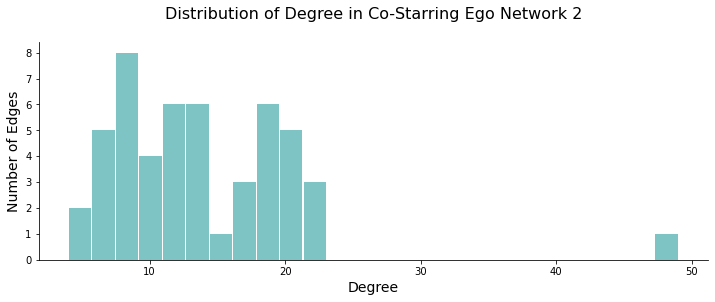

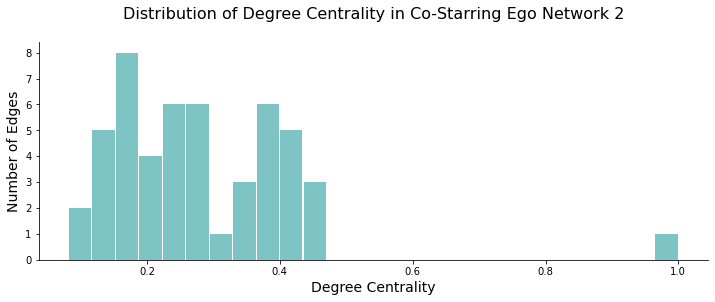

In [119]:
measureStats(ego2, dict(ego2.degree()), "Degree")
print("\n")
measureStats(ego2, nx.degree_centrality(ego2), "Degree Centrality", r=2)
histogram(ego2, 2, 26, dict(ego2.degree()), "Degree", height=4, ego=True)
histogram(ego2, 2, 26, nx.degree_centrality(ego2), "Degree Centrality", height=4, ego=True)

The degrees range from 4 to 49, or degree centralities of 8% to 100%. There is 1 node with the maximum degree centrality of 100%, i.e. connected to all 48 other nodes. We know that this is the ego node, as by definition the ego node is connected to all other nodes in the network. There are only 2 nodes with degree centrality less than 10% (less than about 5 edges). About 29% have a degree centrality score of less than 20%, i.e. less than around 10 edges. Around 53% have between 10 and 20 edges, i.e. degree centrality between 20-40%. The remaining 18% have degree centrality above 40%, i.e. more than 20 edges, with 8 of these having a score below 50%, and one, the ego node, having a score of 100%.



The average degree centrality is 0.26, i.e. on average each node has 12 edges, or is connected to 26% of other nodes.

We can draw our network to further visualise this.

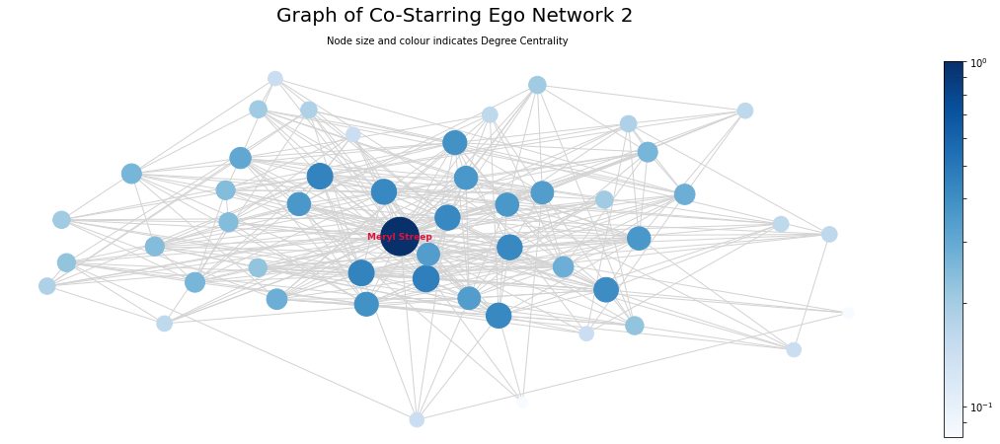

In [120]:
pos = nx.spring_layout(ego2, seed=675, k=1.5)
draw(ego2, pos, nx.degree_centrality(ego2), 'Degree Centrality', 2, 1500, [highestRankedg2], 9, 20, 7, ego=True)

As expected, the ego node has a significantly larger node size and darker node colour than the other nodes indicating a higher degree centrality score.

__Weighted Degree__

Recall that each edge in our network has a weight, which for each edge is the number of movies the two nodes which the edge connects have acted together in. The weighted degree of a node is the sum of the weights on the edges connected to that node. As with the ego network for network 2, the weightedDegree for each node for this ego network will currently be the same as it was in the original network, as weightedNegree is a node attribute. We can recalculate the weightedDegrees only taking into account the edges in the ego network using the same method we used to add the weighted degrees for the original network, and as we did for ego network 1:

In [121]:
weightedDegree(ego2)
print("Weighted Degrees: ")
print(nx.get_node_attributes(ego2, "weightedDegree"))

Weighted Degrees: 
{'0000554': 21, '0000460': 30, '0010736': 17, '0000146': 43, '0000458': 27, '0000173': 25, '0000980': 39, '1113550': 12, '0001057': 18, '0322407': 40, '0000149': 7, '0000213': 8, '0001788': 4, '0000576': 16, '0000658': 78, '0001473': 17, '0350454': 11, '0000354': 30, '0000210': 35, '0000443': 7, '0004778': 11, '0005561': 12, '0000335': 35, '0000158': 25, '0339460': 24, '2143282': 4, '0000112': 13, '0000307': 33, '0000541': 11, '1469236': 11, '0000133': 9, '0000685': 10, '0001584': 10, '0000190': 27, '0924508': 9, '1107001': 17, '1289434': 20, '0910278': 38, '0000949': 23, '0001475': 25, '0000147': 27, '0933940': 12, '0000215': 32, '0000115': 11, '0000140': 23, '0001674': 9, '0914612': 22, '0000437': 29, '0000404': 9, '0001426': 22}


Now that we have added the new weighted degree attributes we can look at the distribution.

Weighted Degree Summary Statistics:

Min:  4
Max:  78 

Mean:  21.0
Median:  19.0


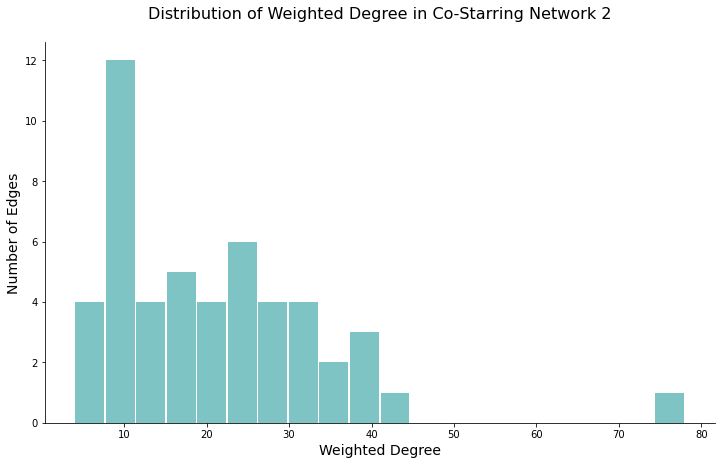

In [122]:
measureStats(ego2, nx.get_node_attributes(ego2, "weightedDegree"), "Weighted Degree")
histogram(ego2, 2, 20, nx.get_node_attributes(ego2, "weightedDegree"), "Weighted Degree", height=7)

The range of weighted degrees is from 4 to 78. 

We can see that only 1 node has a weighted degree above 45. As with the first ego network, we know that this node must be the ego node, as the minimum weighted degree for the ego node is 44 (ego has 48 connections, this would be in the case that every edge connected to the ego has a weight of 1). 

So, the range for the alter's weighted degrees is between 4 and about 45. 8% of nodes (4 nodes) have a weighted degree below about 7. 12 nodes (24%) have a weighted degree between about 8 and 11, and we can see a very large peak for tis bin. From here we can see a right skew. Around 27% have a weighted degree between 11 and 18, and a further 29% between 18 and 30. 10 nodes, i.e. 20% of nodes have a weighted degree between 30 and 45, and only the ego node has a weighted degree above this, with a value of 78.

The average weighted degree is 21. We can again draw our graph, and let node brightness and size indicate weighted degree.

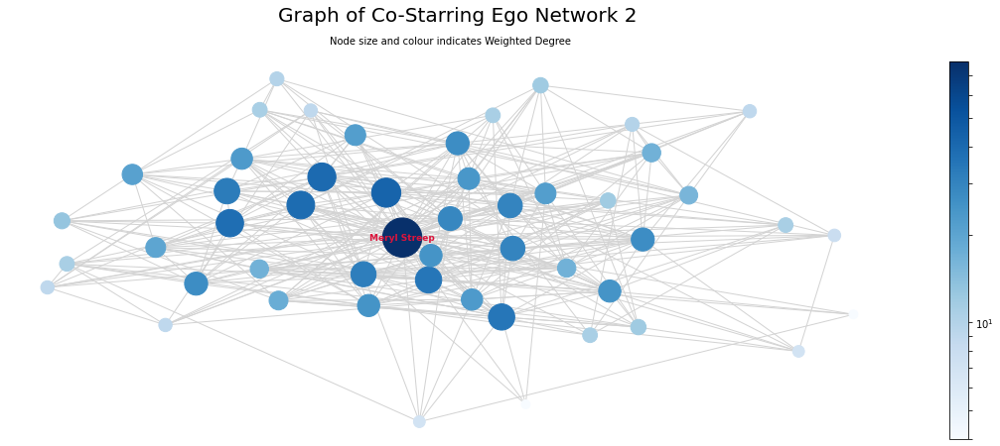

In [123]:
pos = nx.spring_layout(ego2, seed=675, k=1.5)
draw(ego2, pos, nx.get_node_attributes(ego2, "weightedDegree"), 'Weighted Degree', 2, 20, [highestRankedg2], 9, 20, 7, ego=True)

As expected, once again the ego node has a significantly larger node size and darker node colour than the other nodes indicating a higher weighted degree.

__Eigenvector Centrality__

Eigenvector centrality is a basic extension of degree centrality, which defines centrality of a 
node as proportional to its neighbors’ importance. When we sum up all connections of a node, not all 
neighbors are equally important. For eigenvector centrality, relative scores are assigned to all nodes in the network based on the concept that connections to high-scoring nodes contribute more to the score of the node in question than equal connections to low-scoring nodes.

Eigenvector Centrality Summary Statistics:

Min:  0.049
Max:  0.362 

Mean:  0.13
Median:  0.121


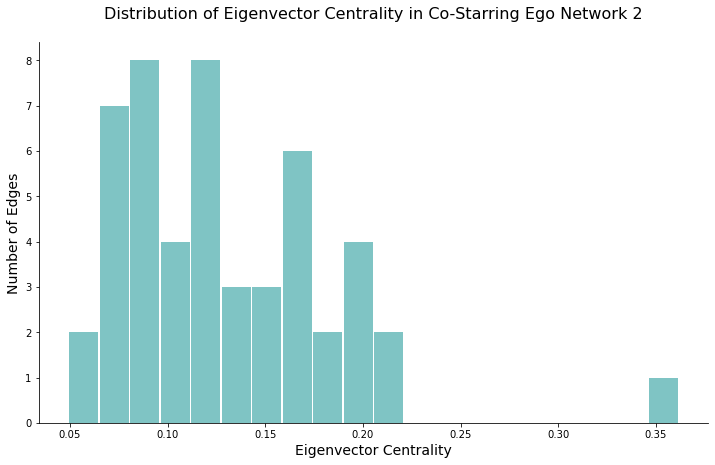

In [124]:
measureStats(ego2, nx.eigenvector_centrality(ego2), "Eigenvector Centrality", 3)
histogram(ego2, 2, 20, nx.eigenvector_centrality(ego2), "Eigenvector Centrality", ego=True)

For eigenvector centrality we can see an approximately normal distribution with a slight right skew, and an outlier at around 0.36. It is likely that this outlier is the eigenvector centrality of the ego but we can check this:

In [125]:
print("Actor with highest eigenvector centrality score: ")
print(ego2.nodes[list(actorsWithHighestOfMeasure(ego2, nx.eigenvector_centrality(ego2), 1).index)[0]]["name"])

Actor with highest eigenvector centrality score: 
Meryl Streep


The ego node has an eigenvector centrality score of 0.362.

The eigenvector centrality scores for the alter range from 0.049 to about 0.225. The distribution looks approximately normal with a slight skew to the right. 34% of nodes have a eigenvector centrality scores below 0.1. About 30% have scores between 0.1 and 0.15. Around 35% of the alters have a score above 0.15.

The mean eigenvector centrality score is 0.13

We can once again draw our ego network and let node size and colour indicate eigenvector centrality.

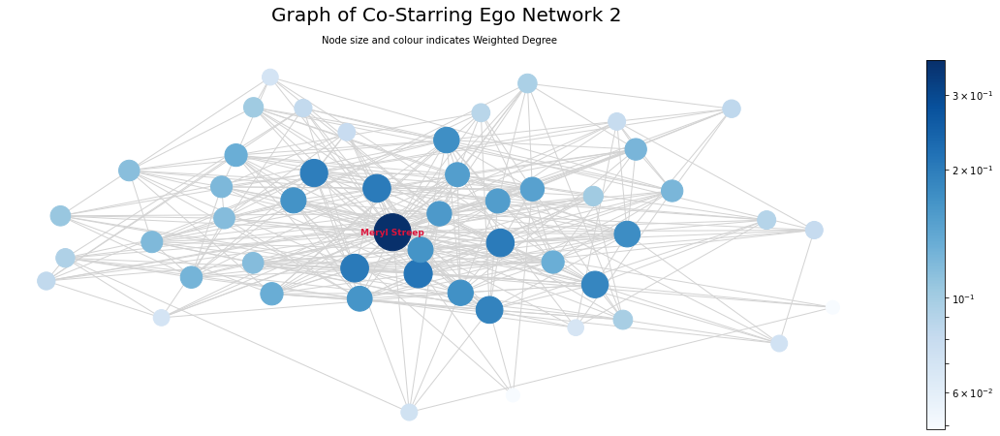

In [126]:
pos = nx.spring_layout(ego2, seed=675, k=1.5)
draw(ego2, pos, nx.eigenvector_centrality(ego2), 'Weighted Degree', 2, 4000, [highestRankedg2], 9, 20, 7, ego=True)

__Betweenness Centrality__

As mentioned for ego network 1, the previous centrality measures do not capture the idea of brokerage. Betweenness centrality identifies strategic linkages, “brokers” or “bridging nodes” in a network.

Nodes that occur on many shortest paths between other nodes in the network have a high betweenness centrality score.

Betweenness Centrality Summary Statistics:

Min:  0.0
Max:  0.266 

Mean:  0.015
Median:  0.006


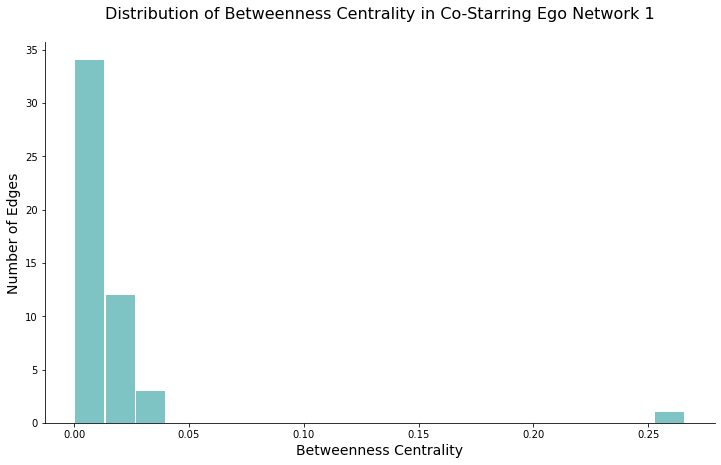

In [127]:
measureStats(ego2, nx.betweenness_centrality(ego2), "Betweenness Centrality", 3)
histogram(ego2, 1, 20, nx.betweenness_centrality(ego2), "Betweenness Centrality", ego=True)

Here we can see that 1 node has a very high betweenness centrality score of above 0.3, while the rest have scores below 0.05. Because of this it is very difficult to see the distribution of the other nodes' values.

It is very likely that the node with the very high betweenness centrality score is the ego node, but we can check this:

In [128]:
print("Actor with highest betweenness centrality score: ")
print(ego2.nodes[list(actorsWithHighestOfMeasure(ego2, nx.betweenness_centrality(ego2), 1).index)[0]]["name"])
print("Score: ", round(nx.betweenness_centrality(ego2)[highestRankedg2], 3))

Actor with highest betweenness centrality score: 
Meryl Streep
Score:  0.266


As expected, the ego node has the highest betweenness centrality score, with a score of 0.266. This is unsurprising as for every pair of nodes in the ego network that are not directly connected, the shortest path between them will be from the first node to the ego node and then to the second node.

As with the first ego network, to more clearly see the distribution of the alters' betweenness centrality scores we can plot the histogram again without the ego node's score.

Betweenness Centrality Summary Statistics:

Min: 0.0 
Max:  0.035 
Mean:  0.01


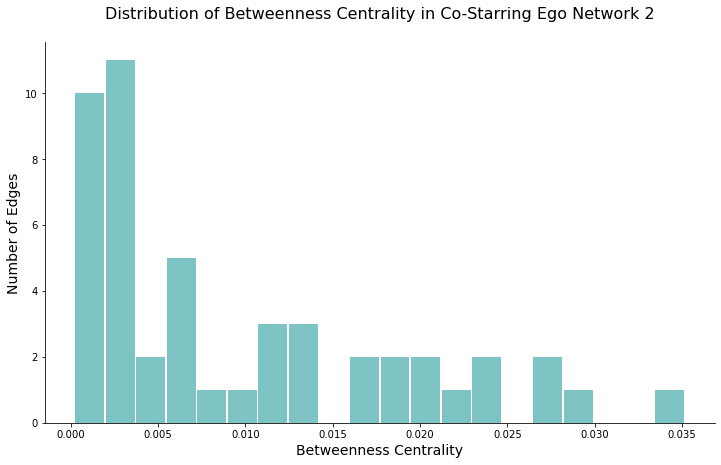

In [129]:
histogram_removeEgo(ego2, 2, 20, nx.betweenness_centrality(ego2), "Betweenness Centrality", ego=True)

Now it is much easier to see the distribution of the betweenness centrality scores of the alters. The range of betweenness centrality scores is 0 - 0.035. There is a peak at about 0-0.001 and at 0.001-0.002 with a counts of 10 and 11 respectively, making up 44% of the alters in total. This is followed by a skew to the right. 75% of alter nodes have a betweenness centrality score below 0.015. There is one node with a score above 0.03. 19% have a score between 0.015 and 0.025, leaving 4 nodes, or 8%, with a score above 0.025.

The mean betweenness centrality score was 0.1.

__Closeness Centrality__

Closeness Centrality measures the extent to which a node is close to all other nodes in a network. It is calculated as the inverse of the mean distance to all other nodes.

Closeness Centrality Summary Statistics:

Min:  0.521
Max:  1.0 

Mean:  0.589
Median:  0.573


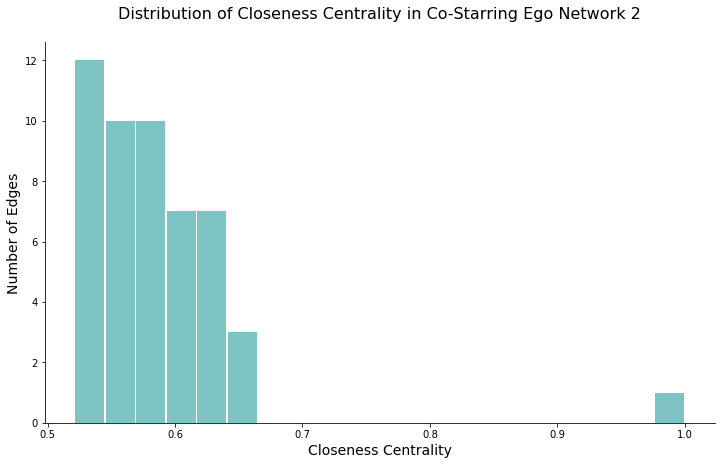

In [130]:
measureStats(ego2, nx.closeness_centrality(ego2), "Closeness Centrality", 3)
histogram(ego2, 2, 20, nx.closeness_centrality(ego2), "Closeness Centrality", ego=True)

Unsurprisingly, we can see that one node has a closeness centrality score of 1. This is the ego node, as it is a distance of 1 from each node by definition, therefore a mean distance of 1, and the inverse of this is 1.

Because the maximum distance between any two nodes in the ego network is 2 (through the ego node), the closeness centrality of a node will depend heavily on the number of direct connections the node has (the degree).

The range of closeness centrality scores for the alters is 0.521 to about 0.66.

12 nodes (24%) have a closeness centrality of around 0.52-0.54, i.e. a mean distance of 1.85-1.92 from every other node. 20 nodes (about 41%) have a closeness centrality of about 0.54-0.59, i.e. a mean distance of 1.69-1.85. A further 35% have a closeness centrality score above this, with just the ego having a score above 0.66.

The mean closeness centrality score is 0.589.

__Conclusion__

I have now analysed the structure anc connectivity of second my ego network by looking at the number of nodes and edges, the density, the diameter and the average clustering coefficient. I then looked at the distribution of various centrality measures, such as degree, eigenvector centrality, betweenness centrality and closeness centrality. For each of these measures we could see that the distribution for the alters was quite similar to that of the distribution for the original full network, and the ego node typically had a significantly higher score than the rest for each measure. This completes my analysis of the second ego network and thus completes Task 3.

## <font color='darkcyan'>Task 4: Network visualisation</font>

For each of the networks created in Task 1:

a) Export the network as a GEXF file.

b) Load the GEXF file in Gephi. Use the layout functionality to produce a useful visualisation of the network. Save a final image of your network visualisation as a PNG file.

My edge attirbutes are currently dictionaries containing weight and a list of movie IDs. I will keep only the weight attribute for exporting to GEXF:

In [131]:
graphs=[g1, g2]
for g in graphs:
    for (n1, n2, d) in g.edges(data=True):
        weight=d["weight"]
        d.clear()
        g[n1][n2]["weight"] = weight

Now I will export each network as a GEXF file:

In [132]:
nx.write_gexf(g1, "Network1.gexf", prettyprint=True)

In [133]:
nx.write_gexf(g2, "Network2.gexf", prettyprint=True)

### <font color='teal'>Gephi</font>

In Gephi for each of my networks I began by setting the __node size and colour to indicate the degree__ of a node in Overview. I set the __edge colour to indicate the edge weight__.

Next I copied the data from the name column to the Label column in Data Labratory.

I then applied the __Fruchterman Reingold__  layout. I tweaked the gravity parameter. The gravity force attracts all nodes to the centre. I kept the gravity low for both networks so that the nodes were spaced out enough for the labels to be readable.

I added the labels with size proportional to node size so that the names of nodes with high degree would stand out. I applied the __label adjust layout__ to prevent label overlap.

I also applied the __no overlap layout__ to the second network, which adds a repulsion force to prevent node overlap, as well as the __expansion layout__ which expands the layout around the centre, as I had a lot of overlapping nodes in the centre.

I set the background to be black for the networks so that the edge colours would stand out, as the edge colour indicates the weight.

For each network, one can __immediately see which nodes have the most connections (highest degrees)__ due to their dark colour and large size and label size. One can also __immediately see clusters__. In each network we can see clusters of actors who worked together in movie series, such as the cluster of Start Wars actors in network 1 in the top left corner (Carrie Fisher, Mark Hamill, Harrison Ford, Daisy Ridley, Adam Driver, etc), and the cluster of Harry Potter actors in the bottom right corner (Michael Gambon, Emma Thompson, Alan Rickman, etc). We can immediately see these due to the width of the edges indicating edge weight. These stand out from the lower weighted edges making these clusters very visible. We can also see a cluster of Harry Potter actors in the bottom right corner of network 2.

## <font color='teal'>Conclusion</font>


__Future Analysis__

I have some ideas for further analysis that I would like to look into in my spare time that I think could be very interesting. One idea is to look at the distribution of the ages of the actors, and compare this for various ego networks. I hypothesise that perhaps younger actors may have more direct connections with other younger actors, and older actors would be connected to more older actors. This was something that I had planned on implementing into the analysis of my ego networks, however it was not going to be as simple as I hoped as for actors that were no longer alive they would have a very high age, so it might be better to compare the ages that actors were during each movie, so using both the year of birth and year of the movie. 

I would also like to look at the distribution of the genres of movies, and seeing if actors typically act in the same genre for most of the movies that they are in. This would involve using an additional dataset of genres corresponding to the movies in my dataset. 

I think it could also be interesting to look at the distribution of actor's sex in the movies, to see if females typically act with other females for example, or if some genres, such as comedy or action for example, are mostly male dominated.

__Reflection__

I thoroughly enjoyed this project. I found it very interesting to use all of the various centrality measures discussed in the class to practice in a real world example. It was also very interesting to compare two different networks, to see the difference that different values for centrality measures can have on very similar networks. I also really enjoyed using Gephi. It was interesting to learn about the various layout options and play around with different layouts, tweaking the parameters to get the perfect layout for my networks. I would definitely like to explore Gephi further and look into not just presenting in Gephi but also analysing. 

Overall I found this project really enjoyable and it really helped me to practice and improved my Networkx and Gephi skills, as well as my skills of analysing and comparing networks and their structure, connectivity and centrality.

#### <font color='darkcyan'>Dervla Scully 18329511</font>